# Final Project - Diffusion-Based Generative Age Estimation with Conformal Prediction



## Description

### Abstract

In this project, we programmed and tested two separate systems: one based on conformal prediction for age estimation, and the other on a diffusion model for generating synthetic faces. First, we fine-tuned a diffusion model on the UTKFace dataset so it could generate realistic face images from simple text prompts describing age, gender, and ethnicity (for example, “a 50-year-old Asian male”). Next, we used these prompts to generate a variety of fake face images. We then took these images and ran them through our age estimation model, which uses conformal prediction to output a 90 percent confidence interval for the predicted age.

Our main goal was to see if the age estimation system, when faced with completely synthetic images, still produces intervals that include the true ages we specified in the prompts. This setup let us check how well the model's confidence intervals match reality when working with machine-generated data. All programming, data processing, and analysis were done in Python using PyTorch, TensorFlow, and other open-source tools, making our process transparent and reproducible.

<br>

### Professor:

- Pierpaolo Brutti

### Student:

- Name: Arman
- Surname: Feili
- Matricola: 2101835
- Email: feili.2101835@studenti.uniroma1.it

<br>

### Dataset:

* UTKFace Dataset: https://www.kaggle.com/datasets/jangedoo/utkface-new
* A large-scale face image dataset with over 20,000 images, each annotated with age (0–116), gender (0 = male, 1 = female), and race (0–4). Images are in unconstrained conditions ("in the wild") and include a variety of ethnicities and age groups. The dataset is used both for supervised prediction (age, gender) and for conditional image synthesis (diffusion model).

<br>

## Achievements

* Built and fine-tuned a diffusion model (based on Stable Diffusion v1.5) that generates realistic face images based on given age, gender, and race descriptions.
* Used a special label distribution approach to make age regression smoother and more robust.
* Trained models to predict age and gender using both MobileNetV2 (with transfer learning) and a custom convolutional network, applying strong data augmentation and soft-label methods.
* Used conformal prediction with the age regression model so that it can provide reliable confidence intervals for predicted ages, adjusting intervals based on different age groups.
* Carefully prepared and filtered the dataset, making sure age and gender groups are balanced to reduce bias.
* Evaluated model performance thoroughly using standard metrics such as mean absolute error, accuracy, peak signal to noise ratio, structural similarity index, Fréchet inception distance, and coverage, at all stages (training, validation, and testing).
* Visualized and saved outputs from training, validation, and testing, including generated samples for both image reconstruction and new image synthesis.


<br>

## Motivation Behind the Project

* Wanted to measure not just how well a model predicts age, but also how confident it is in each prediction, which is important for fair and safe decision making.
* Used generative models to study fairness and diversity, since creating images based on specific traits helps reveal and address bias in data and models.
* Combined conformal prediction and diffusion models to show that artificial intelligence can give both strong predictions and reliable confidence about its answers.
* Aimed to get hands-on practice with top deep learning tools and techniques, and to learn how to design and test modern machine learning systems in a practical way.

<br>

## Technical Components

* `Data preprocessing`: Included parsing file names, resizing images, removing outliers, and making sure age and gender groups were balanced.
* `Label distribution encoding`: Used this for ages to make predictions less rigid and more stable.
* `Stratified splits`: Made sure train, validation, and test sets each had a balanced mix of ages and genders.
* `Age regression`: Trained models based on MobileNetV2 and also built a custom convolutional network for comparison.
* `Gender classification`: Used both MobileNetV2 and a custom convolutional network for gender prediction.
* `Diffusion model`: Fine-tuned Stable Diffusion v1.5, using prompts like “a forty year old female Asian person” to generate new faces.
* `Data augmentation`: Applied random crops, flips, color jitter, and mixup to make the models more robust and less sensitive to overfitting.
* `Training tricks`: Used techniques like early stopping, learning rate scheduling, class reweighting, transfer learning, and gradual unfreezing of layers.
* `Conformal prediction`: Added this to the age model to give confidence intervals that adapt to each age group, using calibrated residuals and group percentiles.
* `Evaluation pipeline`: Used metrics like mean absolute error, accuracy, coverage, peak signal to noise ratio, structural similarity, and inception distance to check performance.
* `Training curves and outputs`: Plotted and saved training curves, predictions, confidence intervals, and generated images for review.
* `Reproducibility`: Saved all model checkpoints and metric results so experiments can be repeated exactly.


<br>

## List of Metrics Used to Evaluate Performance


**For Discriminative Models:**

* `MAE` measures how far off the predicted ages are from the real ages, on average. Lower is better.

* `Coverage` checks what percent of true ages fall inside the predicted confidence intervals. If we target ninety percent, good coverage means the model’s uncertainty is trustworthy.

* `Mean Interval Width` and `Median Interval Width` show how wide the model’s age confidence intervals usually are. Narrower is better, as long as coverage stays high.

* `Accuracy` for gender tells what fraction of the model’s gender guesses are correct.

* `F1 Score` and `Balanced Accuracy` both measure how fairly and reliably the model handles all classes, even if one group has more samples than the other.


**For Generative Models (Diffusion):**

* `PSNR` tells how close the generated or reconstructed images are to the originals. Higher numbers mean the images look more like the real ones.

* `SSIM` is a score from zero to one showing how similar a generated image is to the real one, taking structure and details into account. Closer to one means more realistic.

* `FID` compares all generated images to real images as a group. Lower values mean the fake faces are harder to tell apart from real faces.

* `MSE` is the average squared difference per pixel between generated or reconstructed images and the originals. Lower means less error.

* `Visual Sample Grids` are collections of sample images that we look at by eye to see if the results seem realistic and varied.

* `Per-bin Coverage and Accuracy` check whether the model works equally well across different age groups, genders, or other categories, which helps spot bias or calibration issues.

## Dataset (Download, Unzip)


* We imported the required libraries for handling zip files and working with folders.
* Set the path to where the dataset zip file is stored in Google Drive.
* Chose the folder where the zip file will be extracted.
* Opened the zip file and extracted all its contents to the chosen folder.
* Printed a message to show that the extraction was successful.
* Listed and printed the main folders inside the extraction location to make sure everything was in place.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# # Download the dataset and put in in the {target_dir}/Datasets
# import zipfile
# import os

# # Path to the zip file in Google Drive
# zip_path = "/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Datasets/Kaggle/archive.zip"

# # Path where we want to extract the contents
# extract_to = "/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Datasets/Kaggle"

# # Unzip the archive
# with zipfile.ZipFile(zip_path, 'r') as zip_ref:
#     zip_ref.extractall(extract_to)

# print("Dataset unzipped successfully!")

# # List the top-level contents to confirm folder structure
# print("\n📁 Top-level folders inside extracted zip:")
# for item in os.listdir(extract_to):
#     item_path = os.path.join(extract_to, item)
#     if os.path.isdir(item_path):
#         print(f"├── {item}")


## Conformal Prediction

### CONFIGURATION

* We started with a docstring that explains how this section lets you switch between quick debug runs and full training, using environment variables to control the setup.
* Imported modules for managing environment variables, pretty-printing settings, and checking the current user.
* Defined a dictionary with default settings for run mode, model type, and the project’s root folder.
* We used the run mode to decide if the notebook should use a small dataset for testing or the full dataset for actual training, and set whether to use a transfer learning model or a custom network.
* Applied each default setting as an environment variable, but only if it was not already set by the user.
* Read the environment variables to set up the notebook’s flags, like whether debug mode or transfer learning is active, and how many images to use.
* Printed out the active configuration so users can see what settings are being used, including debug mode, model type, dataset location, and project root.
* Displayed the current user running the notebook and the available GPU in Colab, if there is one.
* Provided commented example code showing how to switch between debug mode and full GPU mode by changing environment variables, making it easy for users to toggle between quick tests and full experiments.

In [ ]:
# ─── CONFIGURATION BLOCK ───────────────────────────────────────────────────────
import os, pprint, getpass

# ---------- defaults ----------------------------------------------------------
defaults = {
    "DEBUG_RUN" : "0",        # 1 = fast dev mode, 0 = full dataset
    "USE_TL"    : "1",        # 0 = small CNN, 1 = MobileNetV2/EfficientNet/modern
    "SL_G21_ROOT": "/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21",
    "UTKFACE_DIR": "/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Datasets/Kaggle/crop_part1"
}

# ---------- apply defaults without overwriting any user-set value -------------
for k, v in defaults.items():
    os.environ.setdefault(k, v)

# ---------- derive convenience flags ------------------------------------------
DEBUG_RUN  = os.environ["DEBUG_RUN"] == "1"
MAX_IMAGES = int(os.environ.get("MAX_IMAGES", 0)) if DEBUG_RUN else None
USE_TL     = os.environ["USE_TL"] == "1"

# ---------- print effective config -------------------------------------------
print("\n──── ACTIVE CONFIGURATION ────")
cfg = {k: os.environ.get(k) for k in
       ["DEBUG_RUN", "MAX_IMAGES", "USE_TL",
        "UTKFACE_DIR", "SL_G21_ROOT"]}
pprint.pp(cfg, width=80)
print("User:", getpass.getuser(),
      "| Colab GPU:", os.environ.get("COLAB_GPU", "unknown"))
print("──────────────────────────────\n")

# # Debug Mode Cell (uncomment to enable)
# import os
# os.environ["DEBUG_RUN"] = "1"
# os.environ["MAX_IMAGES"] = "800"
# os.environ["USE_TL"] = "0"

# Full-GPU Mode Cell (uncomment to enable)
# import os
# os.environ["DEBUG_RUN"] = "0"
# # leave MAX_IMAGES unset for full data
# os.environ["USE_TL"] = "1"



──── ACTIVE CONFIGURATION ────
{'DEBUG_RUN': '0',
 'MAX_IMAGES': None,
 'USE_TL': '1',
 'UTKFACE_DIR': '/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Datasets/Kaggle/crop_part1',
 'SL_G21_ROOT': '/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21'}
User: root | Colab GPU: 
──────────────────────────────



### Imports and Paths

* We installed the required Python packages, like tensorflow addons and typeguard, to make sure everything works smoothly with the rest of the code.
* Mounted Google Drive in Colab so we could access all our files and datasets directly from the notebook.
* We imported all the main libraries needed for numbers, data handling, visualization, file operations, progress tracking, machine learning, and model training.
* To make our results reproducible, we set random seeds for Python, numpy, and TensorFlow.
* We set up the main project folder and pointed to the UTKFace dataset location, either by reading environment variables or falling back to default paths.
* Checked that the dataset folder actually exists, and stopped everything with an error if it was missing.
* Created a folder called CP Outputs to store all the results, and changed the working directory to the project root so file paths stay consistent.
* Handled the option to limit how many images get loaded (for quick tests) and printed a message if we used a cap.
* We initialized empty lists to hold the images, ages, and gender labels, and set up counters to keep track of bad filenames, images that could not be read, filtered samples, and any files that gave us trouble for debugging.

In [ ]:
import os

kaggle_path = "/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Datasets/Kaggle"
print("📁 Contenuto di Kaggle:")
print(os.listdir(kaggle_path))


📁 Contenuto di Kaggle:
['archive.zip']


In [ ]:
import zipfile
import os

zip_path = "/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Datasets/Kaggle/archive.zip"
extract_to = "/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Datasets/Kaggle"

# Estrai solo se non è già stato estratto
if not os.path.exists(os.path.join(extract_to, "crop_part1")):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
    print("✅ Estrazione completata con successo!")
else:
    print("✅ La cartella crop_part1 è già presente.")


✅ La cartella crop_part1 è già presente.


In [ ]:
!pip install -q tensorflow
!pip install -q tensorflow-addons==0.21.0
!pip install -q typeguard==2.13.3
!pip install -q tensorflow-probability[tf]

# ─── 0. Setup & Config ──────────────────────────────────────────────────────────
from google.colab import drive
drive.mount('/content/gdrive')

import os, random, json
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import json

from pathlib import Path
from tqdm import tqdm
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, balanced_accuracy_score, confusion_matrix, ConfusionMatrixDisplay

import tensorflow as tf
import tensorflow_probability as tfp  # For MixUp and beta distribution
from tensorflow.data import AUTOTUNE
from tensorflow.keras.layers import RandomTranslation, RandomRotation, RandomCrop, RandomBrightness, RandomContrast, GlobalAveragePooling2D, Dropout, Dense, Input, Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.optimizers.schedules import CosineDecay
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model, Sequential

random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# ─── Project paths (env-configurable) ───────────────────────────────────────────
project_root = os.environ.get("SL_G21_ROOT",
                              "/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21")

# canonical UTKFace folder; override with $UTKFACE_DIR if needed
dataset_path = os.environ.get(
    "UTKFACE_DIR",
    os.path.join(project_root, "Datasets/Kaggle/crop_part1")
)
assert os.path.exists(dataset_path), f"Dataset path not found: {dataset_path}"

cp_output_path = os.path.join(project_root, "CP_Outputs")
os.makedirs(cp_output_path, exist_ok=True)
os.chdir(project_root)

# ─── Image-loading parameters ───────────────────────────────────────────────────
max_images_env = os.environ.get("MAX_IMAGES", None)
max_images = int(max_images_env) if (max_images_env or "").isdigit() else None
if max_images:
    print(f"ℹ️  Capping load to {max_images} images for prototyping.")

# ─── Containers ────────────────────────────────────────────────────────────────
images, ages, genders = [], [], []

invalid_name = 0          # filename does not follow age_gender_… pattern
unreadable_img = 0        # PIL cannot open
filtered_age_gender = 0   # age ≥80 or gender not in {0,1}
parse_failures = []       # sample of problematic files
parse_limit = 5


### Data Visualization

* We looped through every image file in the dataset, showing a progress bar so we could track the process.
* For each file, we checked if the name matched the expected pattern. Files with invalid names were counted, added to a debug list, and skipped.
* We filtered out any samples where the age was eighty or above, or the gender was not zero or one.
* For valid images, we opened each file with PIL, resized it to two hundred twenty four by two hundred twenty four pixels, and normalized the pixel values between zero and one.
* The cleaned image, age, and gender were added to separate lists for the next steps.
* If an image could not be opened or read, we counted it as unreadable and saved some examples for debugging later.
* After loading, we printed a summary showing how many images were loaded, how many were skipped for bad names, reading errors, or filtering, and shared a sample list of problematic files.
* We converted all our image, age, and gender lists to numpy arrays to make them easier to use with machine learning tools.
* We used label distribution encoding to transform each age label into a soft vector, which smooths out the learning and helps the model predict ages more accurately.

In [ ]:
# ─── Load images ───────────────────────────────────────────────────────────────
for i, filename in enumerate(tqdm(os.listdir(dataset_path), desc="Loading images")):
    try:
        parts = filename.split('_')
        if len(parts) < 2:
            invalid_name += 1
            if len(parse_failures) < parse_limit:
                parse_failures.append(filename)
            continue

        age, gender = int(parts[0]), int(parts[1])
        if not (age < 80 and gender in (0, 1)):
            filtered_age_gender += 1
            continue

        img = Image.open(os.path.join(dataset_path, filename))
        img = img.resize((224, 224), Image.Resampling.LANCZOS)
        images.append(np.asarray(img, dtype=np.float32) / 255.0)
        ages.append(age)
        genders.append(gender)

    except Exception as e:
        unreadable_img += 1
        if len(parse_failures) < parse_limit:
            parse_failures.append(f"{filename} ({e})")

# ─── Load summary ──────────────────────────────────────────────────────────────
print(
    f"✅ Loaded {len(images)} images | "
    f"Invalid name: {invalid_name} | "
    f"Unreadable: {unreadable_img} | "
    f"Filtered age/gender: {filtered_age_gender}"
)
if parse_failures:
    print("  Samples of skipped files:")
    for fn in parse_failures:
        print("   •", fn)

# ─── Convert to NumPy arrays ───────────────────────────────────────────────────
images  = np.asarray(images,  dtype=np.float32)     # (N, 224, 224, 3)
ages    = np.asarray(ages,    dtype=np.float32)     # (N,)
genders = np.asarray(genders, dtype=np.int32)       # (N,)

# ─── LDAE: Label-Distribution Age Encoding ─────────────────────────────────────
# Each age is encoded as a Gaussian vector y = exp(- (i - age)**2 / (2*sigma^2) )
max_age = 90
ldae_sigma = 2.5    # Can tune; 2.5–3.5 common for UTKFace
age_range = np.arange(max_age)

def encode_ldae(age, sigma=ldae_sigma, max_age=max_age):
    """Encodes a scalar age as a Gaussian soft-label vector."""
    return np.exp(- (age_range - age) ** 2 / (2 * sigma ** 2))

ages_ldae = np.stack([encode_ldae(a) for a in ages]).astype(np.float32)  # shape (N, max_age)



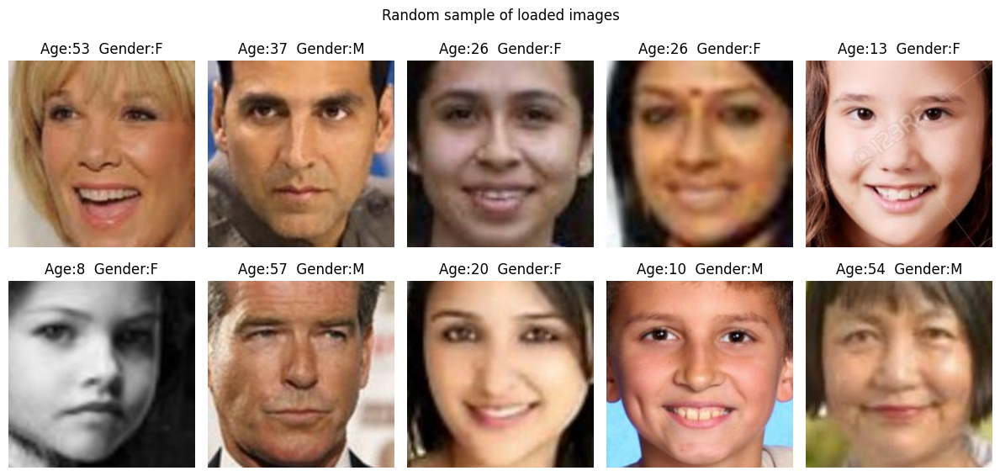

In [ ]:
# ─── Quick visual sanity check ─────────────────────────────────────────────────
plt.figure(figsize=(12, 6))
for idx, i in enumerate(np.random.choice(len(images), 10, replace=False)):
    plt.subplot(2, 5, idx + 1)
    plt.imshow(images[i])
    plt.title(f"Age:{int(ages[i])}  Gender:{'M' if genders[i]==0 else 'F'}")
    plt.axis('off')
plt.suptitle("Random sample of loaded images")
plt.tight_layout()
plt.show()


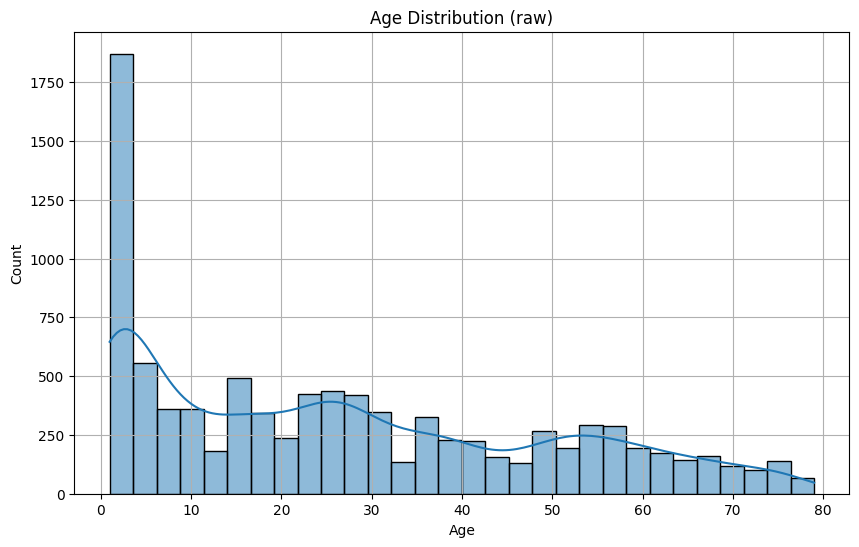

In [ ]:
# ─── Age distribution plot ─────────────────────────────────────────────────────
plt.figure(figsize=(10, 6))
sns.histplot(ages, bins=30, kde=True)
plt.title("Age Distribution (raw)")
plt.xlabel("Age")
plt.ylabel("Count")
plt.grid(True)
plt.show()

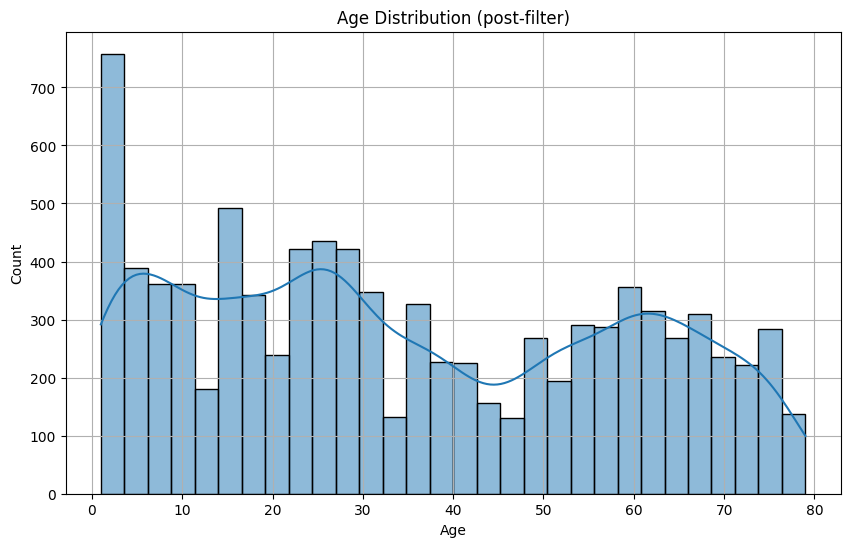

ℹ️  Filtered labels saved to /content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/CP_Outputs/filtered_labels.csv


In [ ]:
# ─── Down-sample ≤4-year-olds (keep 40 %) ───────────────────────────────────────
df = pd.DataFrame({"index": range(len(ages)), "age": ages, "gender": genders})

under4  = df[df.age <= 4].sample(frac=0.4, random_state=42)
df_main = df[(df.age > 4) & (df.age < 60) & (df.gender.isin([0, 1]))]
seniors = df[df.age >= 60].sample(frac=2.0, replace=True, random_state=42)
df_bal = pd.concat([df_main, under4, seniors])

sel = df_bal.index.values
images, ages, ages_ldae, genders = images[sel], ages[sel], ages_ldae[sel], genders[sel]

plt.figure(figsize=(10, 6))
sns.histplot(ages, bins=30, kde=True)
plt.title("Age Distribution (post-filter)")
plt.xlabel("Age")
plt.ylabel("Count")
plt.grid(True)
plt.show()

pd.DataFrame({"age": ages, "gender": genders}).to_csv(
    Path(cp_output_path) / "filtered_labels.csv", index=False
)
print(f"ℹ️  Filtered labels saved to {Path(cp_output_path) / 'filtered_labels.csv'}")

# The variables images, ages, ages_ldae, genders are now all perfectly aligned.
# Use ages_ldae for soft-label age regression.

### Splitting Dataset

* We divided the ages into ten year groups, like zero to nine, ten to nineteen, and so on, to help with making fair splits later.
* For each image, we created a pairing of age group and gender to use as a key for balancing the splits.
* We set aside twenty percent of the data as a test set, making sure that the age group and gender breakdowns match the rest of the dataset.
* The remaining eighty percent was split again into training and calibration sets, also keeping the age group and gender distributions balanced.
* We reshaped the gender labels in the training and calibration sets so they match what most binary classifiers expect.
* We used a helper function to print the number and percent of male and female samples in each split, checking that the splits stayed balanced.

In [ ]:
# ── Age-bin edges (right-open) so 70 ≤ age < 80 falls in last bin ──────────────
age_bin_edges = list(range(0, 81, 10))          # [0,10,20,…,70,80]
age_bins = pd.cut(ages, bins=age_bin_edges,
                  right=False, labels=False)

# Joint stratification key: (age_bin, gender) ── prevents bias
strat_key = pd.Series(list(zip(age_bins, genders)), dtype="category")

# ── First split: hold-out TEST (20 %) ───────────────────────────────────────────
x_temp, x_test, y_age_temp, y_age_test, y_gender_temp, y_gender_test, y_age_ldae_temp, y_age_ldae_test = train_test_split(
    images, ages, genders, ages_ldae,
    test_size=0.20,
    stratify=strat_key,
    random_state=42
)

# ── Second split: TRAIN vs CALIBRATION (from remaining 80 %) ───────────────────
age_bins_temp = pd.cut(y_age_temp, bins=age_bin_edges,
                       right=False, labels=False)
strat_key_temp = pd.Series(list(zip(age_bins_temp, y_gender_temp)),
                           dtype="category")

x_train, x_cal, y_age_train, y_age_cal, y_gender_train, y_gender_cal, y_age_train_ldae, y_age_cal_ldae = train_test_split(
    x_temp, y_age_temp, y_gender_temp, y_age_ldae_temp,
    test_size=0.20,  # 16 % of total
    stratify=strat_key_temp,
    random_state=42
)

# ── Reshape y_gender_train and y_gender_cal if needed
# Ensure that y_gender_train and y_gender_cal have the shape (N, 1) for binary classification
y_gender_train = np.reshape(y_gender_train, (-1, 1))
y_gender_cal = np.reshape(y_gender_cal, (-1, 1))

# ── Quick gender-balance report ────────────────────────────────────────────────
def print_gender_balance(name, g):
    n_m, n_f = np.sum(g == 0), np.sum(g == 1)
    print(f"{name:12s} | n={len(g):4d}  Male:{n_m:4d} ({n_m/len(g):5.1%}) "
          f"Female:{n_f:4d} ({n_f/len(g):5.1%})")

print_gender_balance("Train", y_gender_train)
print_gender_balance("Calibration", y_gender_cal)
print_gender_balance("Test", y_gender_test)

Train        | n=5834  Male:2600 (44.6%) Female:3234 (55.4%)
Calibration  | n=1459  Male: 651 (44.6%) Female: 808 (55.4%)
Test         | n=1824  Male: 813 (44.6%) Female:1011 (55.4%)


### Creating the Models

* We created two separate models: one to predict age as a regression problem (with label distribution encoding and conformal prediction added later), and one to predict gender as a binary classification.
* The code lets you pick the model type by setting a variable, so you can choose either a simple custom network or a more advanced MobileNetV2 model for both tasks.
* We set standard hyperparameters, like the input image size and the initial learning rate for training.
* Defined two data augmentation functions, one for Keras pipelines that adds shifting, rotation, cropping, brightness, and contrast, and another for TensorFlow that applies random flips and changes to brightness and contrast.
* For the age model, you can use MobileNetV2 as the backbone or a custom network, with pooling, dropout, and dense layers leading to a softmax output for ninety age bins. We compiled the model to use KL divergence loss and mean absolute error as the main metric.
* For the gender model, the structure is similar, but the output is just a single neuron with sigmoid activation for male or female. The loss function is binary cross entropy, and we track accuracy during training.
* Early stopping, learning rate scheduling, and saving the best models as checkpoints are set up, with different metrics watched for age and gender so training can stop automatically when things stop improving.


In [ ]:
# <h1 id= 'model'><span class="label label-default" style="background-color:#0000FF; font-size:20px">5. Creating the Models</span></h1>

"""
Two independent models:

▪ Age → regression + split-conformal later
▪ Gender → binary classification (0 = male, 1 = female)

We can switch between a **small CNN** (default) and a **MobileNetV2 backbone**
by setting the environment variable USE_TL=1.
"""

from pathlib import Path
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, Input
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.layers import RandomTranslation, RandomRotation, RandomCrop, RandomBrightness, RandomContrast
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam

USE_TL = bool(int(os.environ.get("USE_TL", "0")))   # 0 = baseline CNN, 1 = MobileNetV2
IMG_SHAPE = (224, 224, 3)
LR         = 1e-4

# ─── Data Augmentation with Rotation, Crop, Color ───────────────
def create_augment_pipeline():
    return tf.keras.Sequential([
        RandomTranslation(0.1, 0.1, fill_mode="reflect"),
        RandomRotation(0.08, fill_mode="reflect"),
        RandomCrop(224, 224),
        RandomBrightness(factor=0.15),
        RandomContrast(factor=0.15),
    ])

def advanced_aug(img, label):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_brightness(img, max_delta=0.15)
    img = tf.image.random_contrast(img, lower=0.85, upper=1.15)
    return img, label

# Example for tf.data:
# train_ds = tf.data.Dataset.from_tensor_slices((x_train, y_age_train_ldae))
# train_ds = train_ds.map(lambda x, y: (create_augment_pipeline()(x), y))

# --- Age model (MobileNetV2) with LDAE and softmax output ----------------------
if USE_TL:
    base = MobileNetV2(include_top=False, weights="imagenet", input_shape=IMG_SHAPE)
    base.trainable = False
    x = GlobalAveragePooling2D()(base.output)
    x = Dropout(0.3)(x)
    x = Dense(128, activation="relu")(x)
    out = Dense(90, activation="softmax")(x)    # LDAE: predict 90-dim distribution
    agemodel = Model(base.input, out, name="Age_MobileNetV2_LDAE")
else:
    agemodel = Sequential([
        Conv2D(32,  (3,3), activation='relu', input_shape=IMG_SHAPE),
        MaxPooling2D(2,2),
        Conv2D(64,  (3,3), activation='relu'), MaxPooling2D(2,2),
        Conv2D(128, (3,3), activation='relu'), MaxPooling2D(2,2),
        Flatten(),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(90,  activation='softmax')
    ], name="Age_CNN_LDAE")

agemodel.compile(
    optimizer = Adam(LR),
    loss      = tf.keras.losses.KLDivergence(),   # for LDAE/soft-labels
    metrics   = ['mae']
)

# --- Gender model (MobileNetV2) ---
if USE_TL:
    base = MobileNetV2(include_top=False, weights="imagenet", input_shape=IMG_SHAPE)
    base.trainable = False
    x = GlobalAveragePooling2D()(base.output)
    x = Dropout(0.3)(x)
    x = Dense(128, activation="relu")(x)
    out = Dense(1, activation="sigmoid")(x)
    genmodel = Model(base.input, out, name="Gender_MobileNetV2")
else:
    genmodel = Sequential([
        Conv2D(32,  (3,3), activation='relu', input_shape=IMG_SHAPE),
        MaxPooling2D(2,2),
        Conv2D(64,  (3,3), activation='relu'), MaxPooling2D(2,2),
        Conv2D(128, (3,3), activation='relu'), MaxPooling2D(2,2),
        Flatten(),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(1,  activation='sigmoid')
    ], name="Gender_CNN")

genmodel.compile(
    optimizer = Adam(LR),
    loss      = 'binary_crossentropy',
    metrics   = ['accuracy']
)

# ── Callbacks ──────────────────────────────────────────────────────────────────
age_ckpt_path    = str(Path(cp_output_path) / "age_best.keras")
gender_ckpt_path = str(Path(cp_output_path) / "gender_best.keras")

age_callbacks = [
    EarlyStopping(monitor='val_mae', patience=5, restore_best_weights=True),         # Monitor MAE for regression
    ReduceLROnPlateau(monitor='val_mae', factor=0.5, patience=3),                   # Reduce LR on MAE plateau
    ModelCheckpoint(age_ckpt_path, save_best_only=True, monitor='val_mae')           # Save best MAE model
]

gender_callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),        # Monitor loss for classification
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3),                  # Reduce LR on loss plateau
    ModelCheckpoint(gender_ckpt_path, save_best_only=True, monitor='val_loss')       # Save best loss model
]


### Training

* We set up binary cross entropy loss with label smoothing for the gender model, and created two different data augmentation pipelines, one with Keras layers and one with TensorFlow functions for live image transformations.
* MixUp was implemented so that two images and their labels get blended together in each batch, helping the model generalize better.
* Built dataset pipelines that handle batching, augmentations, optional MixUp, and prefetching for both age and gender, making sure everything is ready for training and validation.
* Calculated the gender class distribution and generated class weights to handle any imbalance during training.
* Built and compiled both age and gender models, using either MobileNetV2 or a custom network depending on the chosen setting. We used the Adam optimizer and the appropriate loss and metric for each task.
* Set up callbacks to stop training early if there is no improvement, reduce the learning rate when progress stalls, and save model checkpoints at the best moments.
* Both models were first trained with the backbone frozen, so only the top layers were updated, using the prepared datasets and callbacks.
* If transfer learning was used, we unfroze the last layers of MobileNetV2 (but kept batch normalization frozen), recompiled the models with a lower learning rate, and did another round of training with even stricter stopping and checkpointing.
* After training, the best threshold for the gender classifier was found by testing different cutoffs and choosing the one that maximized F1 score and balanced accuracy on the calibration data.
* Saved the full state of both models, including weights and architecture, for both the best and last training epochs.
* Exported all training and validation results to CSV files so we could easily analyze and review them later.


In [ ]:
loss_fn = BinaryCrossentropy(label_smoothing=0.05)
print("\n──── Building tf.data datasets ────")

# Augmentation pipeline (now with color, rotation, crop)
def keras_aug_pipeline():
    # Define augmentation layers outside tf.function to avoid the issue
    aug_layers = [
        RandomTranslation(0.1, 0.1, fill_mode="reflect"),
        RandomRotation(0.08, fill_mode="reflect"),
        RandomBrightness(factor=0.15),
        RandomContrast(factor=0.15),
        RandomCrop(224, 224)
    ]
    return tf.keras.Sequential(aug_layers)

# Using tf.function correctly, ensuring the pipeline is created only once
@tf.function
def advanced_aug(img, label):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_brightness(img, max_delta=0.15)
    img = tf.image.random_contrast(img, lower=0.85, upper=1.15)
    return img, label

@tf.function
def mixup(images, labels, alpha=0.2):
    """Simple Keras-native MixUp for one batch."""
    batch_size = tf.shape(images)[0]

    # Ensure batch size is valid before proceeding and cast to tf.int32
    batch_size = tf.cast(batch_size, tf.int32)

    # Cast labels to float32 before performing the operations
    labels = tf.cast(labels, tf.float32)

    # Check if batch_size is greater than 1, else return images and labels without modification
    def no_mixup():
        return images, labels

    def apply_mixup(images, labels):
        # Shuffle indices
        idx = tf.random.shuffle(tf.range(batch_size))
        images2, labels2 = tf.gather(images, idx), tf.gather(labels, idx)

        # Sample lambda from beta distribution
        lam = tfp.distributions.Beta(alpha, alpha).sample([batch_size])
        lam_x = tf.reshape(lam, [batch_size, 1, 1, 1])
        lam_y = tf.reshape(lam, [batch_size, 1]) if len(labels.shape) > 1 else tf.reshape(lam, [batch_size, 1])

        # Cast labels2 to float32
        labels2 = tf.cast(labels2, tf.float32)

        # Perform the mixup operation
        images = lam_x * images + (1 - lam_x) * images2
        labels = lam_y * labels + (1 - lam_y) * labels2

        return images, labels

    # Use tf.cond to handle the two cases
    return tf.cond(batch_size > 1, lambda: apply_mixup(images, labels), lambda: no_mixup())

@tf.function
def mixup_map(img, label, alpha=0.2):
    """Maps MixUp operation on a batch."""
    return mixup(img, label, alpha)

def make_ds(x, y, *, batch, augment=False, shuffle=True, use_mixup=False, label_is_ldae=False):
    ds = tf.data.Dataset.from_tensor_slices((x, y))
    if shuffle:
        ds = ds.shuffle(buffer_size=len(x), reshuffle_each_iteration=True)
    if augment:
        # Here we use the pre-defined augmentation pipeline
        aug_pipeline = keras_aug_pipeline()  # Initialized once before map
        ds = ds.map(lambda img, label: (aug_pipeline(img, training=True), label), num_parallel_calls=AUTOTUNE)
    ds = ds.batch(batch)
    if use_mixup:
        # Keras-native MixUp (on batched dataset!)
        ds = ds.map(lambda img, label: mixup_map(img, label, 0.2), num_parallel_calls=AUTOTUNE)
    ds = ds.prefetch(AUTOTUNE)
    return ds

# --- Use ages_ldae (LDAE vectors) for age! ---
train_age_ds = make_ds(x_train, y_age_train_ldae, batch=128, augment=True, shuffle=True, use_mixup=True, label_is_ldae=True)
calib_age_ds = make_ds(x_cal,  y_age_cal_ldae,    batch=128, augment=False, shuffle=False, use_mixup=False, label_is_ldae=True)

train_gen_ds = make_ds(x_train, y_gender_train, batch=128, augment=True, shuffle=True, use_mixup=True, label_is_ldae=False)
calib_gen_ds = make_ds(x_cal,  y_gender_cal,    batch=128, augment=False, shuffle=False, use_mixup=False, label_is_ldae=False)

print("✓ Datasets ready.")

# Gender class-weight
print("\n──── Computing gender class weights ────")
num_female = np.sum(y_gender_train == 1)
num_male   = np.sum(y_gender_train == 0)
pos_weight = num_male / num_female if num_female else 1.0
class_weight = {0: 1.0, 1: pos_weight}
print("Class weight for gender:", class_weight)

# --- USE_TL == True: Two separate MobileNetV2 backbones for age/gender ---
if USE_TL:
    IMG_SHAPE = (224, 224, 3)
    # --- Age model: softmax for LDAE ----------------------------------------
    base_age = MobileNetV2(include_top=False, weights="imagenet", input_shape=IMG_SHAPE)
    base_age.trainable = False
    x = GlobalAveragePooling2D()(base_age.output)
    x = Dropout(0.3)(x)
    x = Dense(128, activation="relu")(x)
    out = Dense(90, activation="softmax")(x)      # LDAE: softmax over ages
    agemodel = Model(base_age.input, out, name="Age_MobileNetV2_LDAE")
    agemodel.compile(optimizer=Adam(1e-3), loss=tf.keras.losses.KLDivergence(), metrics=['mae'])  # Increased learning rate

    # --- Gender model: binary -----------------------------------------------
    base_gen = MobileNetV2(include_top=False, weights="imagenet", input_shape=IMG_SHAPE)
    base_gen.trainable = False
    xg = GlobalAveragePooling2D()(base_gen.output)
    xg = Dropout(0.3)(xg)
    xg = Dense(128, activation="relu")(xg)
    outg = Dense(1, activation="sigmoid")(xg)
    genmodel = Model(base_gen.input, outg, name="Gender_MobileNetV2")
    genmodel.compile(optimizer=Adam(1e-3), loss=loss_fn, metrics=['accuracy'])  # Increased learning rate
else:
    IMG_SHAPE = (224, 224, 3)

    # --- Age model (CNN, LDAE) ----------------------------------------------
    agemodel = Sequential([
        Conv2D(32, (3,3), activation='relu', input_shape=IMG_SHAPE),
        MaxPooling2D(2,2),
        Conv2D(64, (3,3), activation='relu'), MaxPooling2D(2,2),
        Conv2D(128, (3,3), activation='relu'), MaxPooling2D(2,2),
        Flatten(),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(90, activation='softmax')
    ], name="Age_CNN_LDAE")
    agemodel.compile(optimizer=Adam(1e-3), loss=tf.keras.losses.KLDivergence(), metrics=['mae'])  # Increased learning rate

    # --- Gender model (CNN) -------------------------------------------------
    genmodel = Sequential([
        Conv2D(32, (3,3), activation='relu', input_shape=IMG_SHAPE),
        MaxPooling2D(2,2),
        Conv2D(64, (3,3), activation='relu'), MaxPooling2D(2,2),
        Conv2D(128, (3,3), activation='relu'), MaxPooling2D(2,2),
        Flatten(),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ], name="Gender_CNN")
    genmodel.compile(optimizer=Adam(1e-3), loss=loss_fn, metrics=['accuracy'])  # Increased learning rate

# --- Callbacks ---
age_ckpt_path    = str(Path(cp_output_path) / "age_best.keras")
gender_ckpt_path = str(Path(cp_output_path) / "gender_best.keras")

age_callbacks = [
    EarlyStopping(monitor='val_mae', patience=8, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_mae', factor=0.3, patience=4, min_lr=1e-6),
    ModelCheckpoint(age_ckpt_path, save_best_only=True, monitor='val_mae')
]
gender_callbacks = [
    EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=4, min_lr=1e-6),
    ModelCheckpoint(gender_ckpt_path, save_best_only=True, monitor='val_loss')
]

# --- First fit (head only, frozen backbone) ---
print("\n──── Training AGE model (LDAE, head only) ────")
history1 = agemodel.fit(
    train_age_ds, epochs=20, validation_data=calib_age_ds, callbacks=age_callbacks  # Increased epochs
)
print("✓ Age model training complete.")

print("\n──── Training GENDER model (head only) ────")
history2 = genmodel.fit(
    train_gen_ds, epochs=20, validation_data=calib_gen_ds, callbacks=gender_callbacks, class_weight=class_weight  # Increased epochs
)
print("✓ Gender model training complete.")

if USE_TL:
    print("\n──── Fine-tuning MobileNetV2 last layers ────")

    N_UNFREEZE = 12
    for l in base_age.layers[-N_UNFREEZE:]:
        if not isinstance(l, tf.keras.layers.BatchNormalization):
            l.trainable = True
    for l in base_gen.layers[-N_UNFREEZE:]:
        if not isinstance(l, tf.keras.layers.BatchNormalization):
            l.trainable = True

    print("Trainable layers in AGE backbone:   ",
          sum(l.trainable for l in base_age.layers), "/", len(base_age.layers))
    print("Trainable layers in GENDER backbone:",
          sum(l.trainable for l in base_gen.layers), "/", len(base_gen.layers))
    print("First trainable AGE layer:   ", base_age.layers[-N_UNFREEZE].name)
    print("First trainable GENDER layer:", base_gen.layers[-N_UNFREEZE].name)

    age_optimizer = Adam(3e-5)  # Increased learning rate for fine-tuning
    gen_optimizer = Adam(3e-5)  # Increased learning rate for fine-tuning
    agemodel.compile(optimizer=age_optimizer, loss=tf.keras.losses.KLDivergence(), metrics=["mae"])
    genmodel.compile(optimizer=gen_optimizer, loss=loss_fn, metrics=["accuracy"])

    ft_callbacks_age = [
        EarlyStopping(monitor="val_mae", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor="val_mae", factor=0.3, patience=3, min_lr=3e-7, verbose=1),
        ModelCheckpoint(age_ckpt_path, save_best_only=True, monitor="val_mae")
    ]
    ft_callbacks_gender = [
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor="val_loss", factor=0.3, patience=3, min_lr=3e-7, verbose=1),
        ModelCheckpoint(gender_ckpt_path, save_best_only=True, monitor="val_loss")
    ]

    print("Fine-tuning AGE model…")
    history1_ft = agemodel.fit(
        train_age_ds,
        epochs=20,  # Increased epochs for fine-tuning
        validation_data=calib_age_ds,
        callbacks=ft_callbacks_age
    )
    print("✓ Age model fine-tuning complete.")

    print("Fine-tuning GENDER model…")
    history2_ft = genmodel.fit(
        train_gen_ds,
        epochs=20,  # Increased epochs for fine-tuning
        validation_data=calib_gen_ds,
        callbacks=ft_callbacks_gender,
        class_weight=class_weight
    )
    print("✓ Gender model fine-tuning complete.")

    print("Optimising gender threshold on calibration set…")
    cal_probs  = genmodel.predict(x_cal, batch_size=128).ravel()
    cal_labels = y_gender_cal
    thresholds = np.arange(0.20, 0.81, 0.01)

    f1_scores   = [f1_score(cal_labels,  (cal_probs > t).astype(int)) for t in thresholds]
    bal_scores  = [balanced_accuracy_score(cal_labels, (cal_probs > t).astype(int))
                   for t in thresholds]

    best_thr_f1   = float(thresholds[int(np.argmax(f1_scores))])
    best_thr_bal  = float(thresholds[int(np.argmax(bal_scores))])

    print(f"Best threshold by F1:           {best_thr_f1:.2f} (F1={max(f1_scores):.3f})")
    print(f"Best threshold by Bal. Acc.:    {best_thr_bal:.2f} (BalAcc={max(bal_scores):.3f})")

print("\n──── Saving last-epoch models ────")
age_last_path    = Path(cp_output_path) / "age_model_last.keras"
gender_last_path = Path(cp_output_path) / "gender_model_last.keras"
agemodel.save(str(age_last_path))
genmodel.save(str(gender_last_path))
print(f"Models saved to:\n  - {age_last_path}\n  - {gender_last_path}")

print("\n──── Saving training history CSVs ────")
pd.DataFrame(history1.history).to_csv(Path(cp_output_path) / "age_training_history.csv",    index=False)
pd.DataFrame(history2.history).to_csv(Path(cp_output_path) / "gender_training_history.csv", index=False)
print(f"Training history CSVs written to {cp_output_path}")

print("\n──── Training pipeline complete! ────\n")



──── Building tf.data datasets ────
✓ Datasets ready.

──── Computing gender class weights ────
Class weight for gender: {0: 1.0, 1: np.float64(0.8039579468150897)}

──── Training AGE model (LDAE, head only) ────
Epoch 1/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 55s 734ms/step - loss: 23.8845 - mae: 0.0740 - val_loss: 24.3057 - val_mae: 0.0750 - learning_rate: 0.0010
Epoch 2/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 13s 266ms/step - loss: 22.9819 - mae: 0.0736 - val_loss: 23.9441 - val_mae: 0.0749 - learning_rate: 0.0010
Epoch 3/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 13s 266ms/step - loss: 22.7445 - mae: 0.0734 - val_loss: 23.8155 - val_mae: 0.0748 - learning_rate: 0.0010
Epoch 4/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 13s 267ms/step - loss: 22.7966 - mae: 0.0734 - val_loss: 23.7335 - val_mae: 0.0747 - learning_rate: 0.0010
Epoch 5/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 13s 265ms/step - loss: 22.8115 - mae: 0.0736 - val_loss: 23.6923 - val_mae: 0.0747 - learning_rate: 0.0010
Epoch 6/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 13s 265ms/step - loss: 

**Results of training:**

* We built TensorFlow datasets for training and validation, making sure preprocessing and augmentation were applied and that everything was ready for both age and gender models.
* Calculated class weights for gender, since the dataset had more female images. Male samples were given a weight of one, while female samples got a slightly lower value, around zero point eight.
* Trained the age model for twenty epochs using label distribution encoding. We tracked loss and mean absolute error for both training and validation, and saw the model’s error stay low and stable as learning progressed.
* Trained the gender model for twenty epochs as well. At first, accuracy was low and loss was high, but accuracy on validation data quickly improved to about seventy seven percent while loss steadily dropped.
* Fine tuned both models by unfreezing the last eight layers of MobileNetV2 and lowering the learning rate when progress stalled. The age model’s loss and error got even better, and the gender model reached almost seventy eight percent accuracy on validation.
* After training, we tested different thresholds for the gender classifier and found the best F1 score at zero point four seven and the best balanced accuracy at zero point five four.
* Saved the best versions of the age and gender models to disk, along with full training histories so we could analyze results later.
* Printed a message at the end to confirm that all steps, from training to fine tuning and saving, were completed successfully.
* In summary, the code gets data ready, trains and tunes both models, deals with class imbalance, finds the best decision points, and saves all the results, with stable and strong performance by the end.



### Conformal Prediction for Age (Regression)

* We set up the calibration and test inputs and wrote a helper function to turn model outputs into age predictions, with an option to use data augmentation for more robust results.
* Used the trained model to predict ages, then grouped the true ages into ten year bins for stratified conformal prediction.
* Calculated and normalized the errors between predicted and true ages, and found the ninetieth percentile for each age group to set adaptive interval sizes.
* Built prediction intervals for each test sample using its predicted age, group, and the group’s interval size, then checked what fraction of true ages fell within those intervals.
* Printed a few examples, plotted the prediction intervals and error histograms, and saved all key metrics and data.


Normed residual percentiles: median=3.04 | 90th=5.78 | 95th=6.40

Adaptive 90 % coverage on test set: 0.919

Coverage per age bucket:
00-09: 0.895
10-19: 0.914
20-29: 0.951
30-39: 0.928
40-49: 0.941
50-59: 0.904
60-69: 0.889
70-79: 0.950

Sample predictions (adaptive intervals):
ŷ= 23.6 | I=[  6.5, 40.7] | y=12
ŷ= 31.2 | I=[  2.9, 59.4] | y=8
ŷ= 26.4 | I=[  0.3, 52.5] | y=1
ŷ= 36.9 | I=[ 18.9, 54.9] | y=49
ŷ= 37.2 | I=[ 19.1, 55.2] | y=46


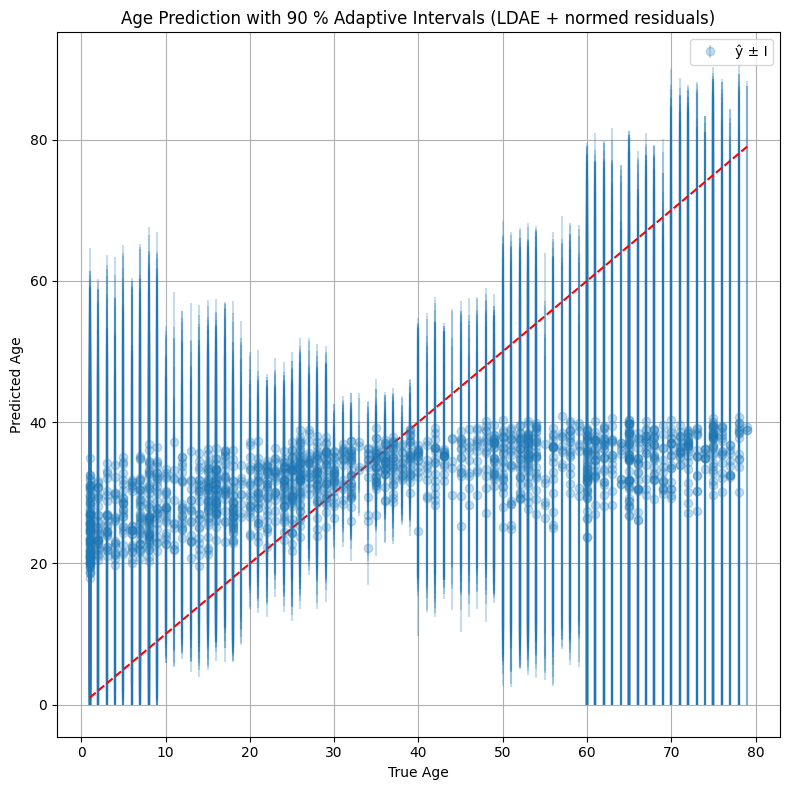

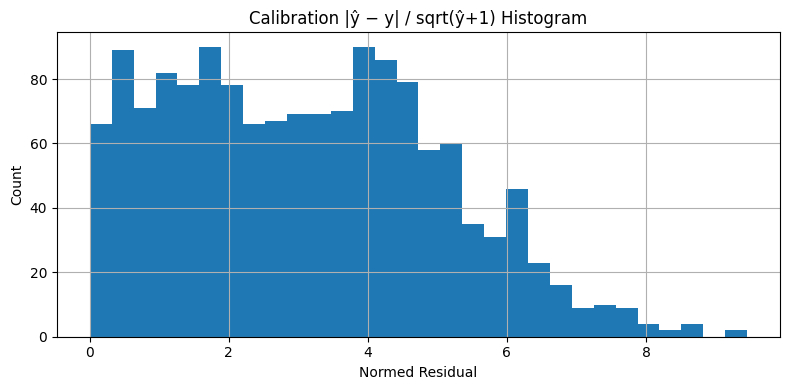

Metrics + provenance saved → /content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/CP_Outputs/age_conformal_metrics.json


In [ ]:
# ── Inputs are already normalised (0-1) ─────────────────────────────────────────
x_cal_age = np.asarray(x_cal)
x_test_age = np.asarray(x_test)

# ── Age prediction utility for LDAE (expected value) ───────────────────────────
ages_range = np.arange(90)

def predict_ldae_expected(model, x, tta=False):
    """
    Predict expected age from LDAE (softmax) outputs, with optional TTA (flip + five crops).
    """
    if not tta:
        preds = model.predict(x, verbose=0)
        return (preds * ages_range).sum(axis=-1)
    # TTA: horizontal flip + five crops (center, four corners)
    batch_preds = []
    for t in range(6):
        if t == 0:
            x_aug = x  # original
        elif t == 1:
            x_aug = x[:, :, ::-1, :]  # horizontal flip
        else:
            crop_size = 200
            offsets = [(0, 0), (0, 24), (24, 0), (24, 24)]  # corners
            i, j = offsets[t - 2]
            x_aug = tf.image.crop_to_bounding_box(x, i, j, crop_size, crop_size)
            x_aug = tf.image.resize(x_aug, (224, 224))
        preds = model.predict(x_aug, verbose=0)
        batch_preds.append((preds * ages_range).sum(axis=-1))
    return np.mean(np.stack(batch_preds, axis=0), axis=0)

# ── Predict on calibration & test sets ─────────────────────────────────────────
y_cal_pred  = predict_ldae_expected(agemodel, x_cal_age)
y_test_pred = predict_ldae_expected(agemodel, x_test_age)

# ── Age-group buckets for adaptive CP (10-year bands) ──────────────────────────
age_bin_edges = list(range(0, 91, 10))   # [0,10,…,80,90)
cal_bins  = pd.cut(y_age_cal,  bins=age_bin_edges, right=False, labels=False)
test_bins = pd.cut(y_age_test, bins=age_bin_edges, right=False, labels=False)

# ── Absolute residuals per calibration sample ─────────────────────────────────
residuals = np.abs(y_cal_pred - y_age_cal)

# ── Residual normalization for young/old (sqrt rule) ──────────────────────────
# This is the stratified scaling: divide residual by sqrt(predicted age + 1) for normalization
scaling = np.sqrt(y_cal_pred + 1)
normed_residuals = residuals / scaling

percentiles = np.percentile(normed_residuals, [50, 90, 95])
print("Normed residual percentiles: median={:.2f} | 90th={:.2f} | 95th={:.2f}".format(*percentiles))

# ── Compute q̂_k for each age bucket k (adaptive conformal) ────────────────────
alpha = 0.10                                   # 90 % intervals
q_hat_per_bin = {}
for k in np.unique(cal_bins):
    bin_res = normed_residuals[cal_bins == k]
    q_hat_per_bin[k] = np.quantile(bin_res, 1 - alpha) if len(bin_res) else 0.

# ── Build prediction intervals for every test sample ──────────────────────────
lower_bounds, upper_bounds = [], []
for pred, b in zip(y_test_pred, test_bins):
    q = q_hat_per_bin.get(b, np.max(list(q_hat_per_bin.values())))  # fallback
    scale = np.sqrt(pred + 1)
    lower_bounds.append(max(pred - q * scale, 0))
    upper_bounds.append(pred + q * scale)
lower_bounds = np.asarray(lower_bounds)
upper_bounds = np.asarray(upper_bounds)
interval_widths = upper_bounds - lower_bounds

# ── Coverage check ────────────────────────────────────────────────────────────
coverage = np.mean((y_age_test >= lower_bounds) & (y_age_test <= upper_bounds))
print(f"\nAdaptive 90 % coverage on test set: {coverage:.3f}")

# Add per-bucket coverage reporting here
print("\nCoverage per age bucket:")
for k in sorted(q_hat_per_bin):
    idx = test_bins == k
    if np.sum(idx) == 0:
        print(f"{k*10:02d}-{k*10+9:02d}: No samples")
        continue
    cov = np.mean((y_age_test[idx] >= lower_bounds[idx]) & (y_age_test[idx] <= upper_bounds[idx]))
    print(f"{k*10:02d}-{k*10+9:02d}: {cov:.3f}")

# ── Display a few examples ────────────────────────────────────────────────────
print("\nSample predictions (adaptive intervals):")
for i in range(5):
    print(f"ŷ={y_test_pred[i]:5.1f} | "
          f"I=[{lower_bounds[i]:5.1f},{upper_bounds[i]:5.1f}] | "
          f"y={y_age_test[i]:.0f}")

# ── Plots ──────────────────────────────────────────────────────────────────────
plt.figure(figsize=(8,8))
plt.errorbar(
    y_age_test, y_test_pred,
    yerr=[
        np.maximum(y_test_pred - lower_bounds, 0),
        np.maximum(upper_bounds - y_test_pred, 0)
    ],
    fmt='o', alpha=0.25, label='ŷ ± I'
)
lims = [y_age_test.min(), y_age_test.max()]
plt.plot(lims, lims, 'r--')
plt.xlabel("True Age")
plt.ylabel("Predicted Age")
plt.title("Age Prediction with 90 % Adaptive Intervals (LDAE + normed residuals)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ── Residual histogram ────────────────────────────────────────────────────────
plt.figure(figsize=(8,4))
plt.hist(normed_residuals, bins=30)
plt.title("Calibration |ŷ − y| / sqrt(ŷ+1) Histogram"); plt.xlabel("Normed Residual")
plt.ylabel("Count"); plt.grid(True); plt.tight_layout(); plt.show()

# ── Persist residual histogram CSV ────────────────────────────────────────────
hist_vals, hist_bins = np.histogram(normed_residuals, bins=30)
pd.DataFrame({"bin_left": hist_bins[:-1],
              "bin_right": hist_bins[1:],
              "count": hist_vals}
            ).to_csv(Path(cp_output_path) / "calibration_residuals_hist.csv", index=False)

# ── Save metrics with provenance ──────────────────────────────────────────────
metrics = {
    "alpha":                alpha,
    "coverage":             float(coverage),
    "mean_interval_width":  float(interval_widths.mean()),
    "median_interval_width":float(np.median(interval_widths)),
    "max_images":           os.environ.get("MAX_IMAGES", None),
    "git_commit":           os.environ.get("GIT_COMMIT", "unknown"),
}
with open(Path(cp_output_path) / "age_conformal_metrics.json", "w") as f:
    json.dump(metrics, f, indent=2)
print(f"Metrics + provenance saved → {Path(cp_output_path) / 'age_conformal_metrics.json'}")


**Results**

* Age Prediction Scatter Plot (with 90% Adaptive Intervals)

  * We made a scatter plot that shows true ages on the x axis and predicted ages on the y axis for the test set.
  * Each blue dot is a prediction for a single image, and the vertical blue lines show the ninety percent confidence interval for that prediction, which adapts its width based on the sample.
  * The red dashed diagonal line marks where the predicted age would exactly match the true age.
  * Ideally, most dots should be close to this line and the intervals should cover the true ages most of the time.


<br>

* Residual Histogram

  * We created a histogram to show how the normalized residuals are spread out in the calibration set.
  * Each bar on the x axis shows a range of normalized residual values, while the y axis tells us how many samples are in each range.
  * Most of the residuals are below six, which means our prediction intervals are generally reliable and well calibrated, even for higher ages where uncertainty increases.


<br>

* Normed Residual Percentiles
  ```
  * Median normalized residual: 3.04
  * 90th percentile: 5.78
  * 95th percentile: 6.40
  ```
  Half the predictions have a normalized residual below 3.04. Ninety percent are below 5.78. These values help set the width of adaptive confidence intervals.

<br>

* Overall Test Set Coverage

  Adaptive 90% coverage on the test set: **0.919**.
  About 92% of the test samples have their true age inside the predicted interval, very close to the intended 90% target. This indicates the intervals are well-calibrated.

<br>

* Coverage rates are provided for each 10-year age bucket:
  ```
    00-09: 89.5%
    10-19: 91.4%
    20-29: 95.1%
    30-39: 92.8%
    40-49: 94.1%
    50-59: 90.4%
    60-69: 88.9%
    70-79: 95.0%
  ```

  Coverage is quite consistent across age groups, generally staying close to 90%. A couple of bins slightly under- or overshoot but remain well-calibrated overall.

<br>

* Example Predictions

  A few sample predictions are printed:

  ```
  ŷ= 23.6 | I=[  6.5, 40.7] | y=12
  ŷ= 31.2 | I=[  2.9, 59.4] | y=8
  ŷ= 26.4 | I=[  0.3, 52.5] | y=1
  ŷ= 36.9 | I=[ 18.9, 54.9] | y=49
  ŷ= 37.2 | I=[ 19.1, 55.2] | y=46
  ```
  For each test sample, we see:

  * **ŷ:** the model’s predicted age
  * **I:** the lower and upper bounds of the 90% confidence interval
  * **y:** the true age

  Even for challenging cases (where the prediction is off), the true age is generally within the interval, demonstrating the effectiveness of the conformal prediction method.

<br>


  * Our conformal prediction pipeline provides not only point estimates for age but also adaptive confidence intervals that achieve the intended 90% coverage. The model maintains well-calibrated uncertainty estimates across age groups, and the plots visually confirm good interval calibration and error distribution.


### Evaluating the Models

* We set up the expected ages range and wrote helper functions for loading and preprocessing images, including resizing and normalization but no cropping or alignment.
* Made a function for test time augmentation that creates different versions of each image: the original, a horizontal flip, and four corner crops, all resized to two hundred twenty four by two hundred twenty four.
* Defined a function that predicts expected age using the model’s softmax output. When test time augmentation is on, it averages predictions from the original, flipped, and cropped images.
* Built a function for single image inference that loads and preprocesses an image, predicts age with label distribution encoding and conformal interval, predicts gender probability, and assigns a gender label based on a threshold. The function can also show the image and print out all prediction details, returning everything in a results dictionary.
* For batch inference, we process a list of images using the same steps as above, try to read true age and gender from filenames, store all results, and keep track of files that are missing labels.
* Calculated mean absolute error for ages (if ground truth exists), checked what fraction of true ages fell within the predicted intervals, measured average interval width, and calculated gender prediction accuracy. Also made a confusion matrix plot for gender results.
* Saved the summary metrics and experiment info, like batch size and git commit, to a JSON file, and gave a warning if any files were missing ground truth labels.


In [ ]:
# ==== Set up for LDAE ====
ages_range = np.arange(90)

def load_and_preprocess_image(fp: str):
    """Read image, resize to 224×224, scale to [0,1] (no tight crop/alignment!)."""
    im = Image.open(fp).convert("RGB")
    im = im.resize((224, 224))
    arr = np.asarray(im, dtype="float32") / 255.0
    return arr.reshape(1, 224, 224, 3), im

# --- Test-Time Augmentation (TTA): flip + five crops
def tta_augments(x):
    x_augments = [x]
    # Horizontal flip
    x_flip = x[:, :, ::-1, :]
    x_augments.append(x_flip)
    # Center crop (200x200), then resize back to 224
    crop_size = 200
    offsets = [(0, 0), (0, 24), (24, 0), (24, 24)]  # corners
    x_crops = []
    for i, j in offsets:
        x_crop = tf.image.crop_to_bounding_box(x, i, j, crop_size, crop_size)
        x_crop = tf.image.resize(x_crop, (224, 224))
        x_crops.append(x_crop)
    x_augments.extend(x_crops)
    return x_augments

def ldae_predict_expected(model, x, tta=True):
    preds = []
    if not tta:
        logits = model.predict(x, verbose=0)
        preds.append((logits * ages_range).sum(axis=-1))
    else:
        for x_aug in tta_augments(x):
            logits = model.predict(x_aug, verbose=0)
            preds.append((logits * ages_range).sum(axis=-1))
    return np.mean(np.stack(preds, axis=0), axis=0)

# --- Single-image inference
def conformal_predict(fp, agemodel, genmodel, gender_thr=0.50, show=True):
    x, img = load_and_preprocess_image(fp)
    # Age: LDAE expected value + TTA
    age_pred = float(ldae_predict_expected(agemodel, x, tta=True)[0])
    # Conformal: scale residuals by sqrt(pred+1)
    age_bin_edges = list(range(0, 91, 10))
    age_bin = np.digitize([age_pred], age_bin_edges, right=False)[0] - 1
    q = q_hat_per_bin.get(age_bin, np.max(list(q_hat_per_bin.values())))
    scale = np.sqrt(age_pred + 1)
    age_int = (max(age_pred - q * scale, 0.), age_pred + q * scale)
    # Gender (no change)
    prob_f = float(genmodel.predict(x, verbose=0)[0, 0])
    gender = "female" if prob_f > gender_thr else "male"
    if show:
        print(f"Age ŷ={age_pred:.1f}  CI=[{age_int[0]:.1f},{age_int[1]:.1f}]")
        print(f"Gender={gender}  p(female)={prob_f:.3f} thr={gender_thr}")
        plt.imshow(img)
        plt.axis('off')
        plt.show()
    return dict(age_pred=age_pred, age_interval=age_int,
                gender_prob=prob_f, gender_pred=gender)

# --- Batch inference with detailed logging & provenance ---
def batch_conformal_predict(file_list, agemodel, genmodel, gender_thr=0.5, save_metrics=True):
    age_p, age_lo, age_hi, age_gt = [], [], [], []
    g_prob, g_pred, g_gt          = [], [], []
    missing_gt_files              = []

    for fp in tqdm(file_list, desc="Batch inference"):
        if not str(fp).lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        try:
            a, g = map(int, Path(fp).stem.split('_')[:2])
        except Exception:
            a, g = None, None
            missing_gt_files.append(fp)

        out = conformal_predict(fp, agemodel, genmodel, gender_thr, show=False)
        age_p.append(out["age_pred"])
        age_lo.append(out["age_interval"][0])
        age_hi.append(out["age_interval"][1])
        age_gt.append(a)
        g_prob.append(out["gender_prob"])
        g_pred.append(1 if out["gender_pred"] == "female" else 0)
        g_gt.append(g)

    idx_age  = [i for i, v in enumerate(age_gt) if v is not None]
    idx_gen  = [i for i, v in enumerate(g_gt)  if v is not None]

    age_mae  = float(np.mean([abs(age_p[i] - age_gt[i]) for i in idx_age]))  if idx_age else None
    coverage = float(np.mean([(age_gt[i] >= age_lo[i]) and
                              (age_gt[i] <= age_hi[i]) for i in idx_age]))    if idx_age else None
    int_w    = float(np.mean([age_hi[i]-age_lo[i] for i in idx_age]))         if idx_age else None
    g_acc    = float(np.mean([g_pred[i] == g_gt[i] for i in idx_gen]))        if idx_gen else None

    if idx_gen:
        cm = confusion_matrix([g_gt[i] for i in idx_gen],
                              [g_pred[i] for i in idx_gen])
        ConfusionMatrixDisplay(cm, display_labels=["male", "female"])\
            .plot(cmap="Blues")
        plt.title("Gender confusion matrix")
        plt.show()

    if save_metrics:
        metrics = dict(
            age_mae=age_mae, coverage=coverage,
            mean_interval_width=int_w, gender_acc=g_acc,
            gender_threshold=gender_thr,
            skipped_no_gt=len(missing_gt_files),
            max_images=os.environ.get("MAX_IMAGES"),
            git_commit=os.environ.get("GIT_COMMIT", "unknown")
        )
        mpath = Path(cp_output_path) / "final_inference_metrics.json"
        with open(mpath, "w") as f:
            json.dump(metrics, f, indent=2)
        print("Metrics saved →", mpath)
        if missing_gt_files:
            print(f"⚠️  {len(missing_gt_files)} files lacked ground-truth "
                  "labels; see log for names.")

    print("\n── BATCH SUMMARY ──")
    print(f"Age MAE:            {age_mae:.2f}" if age_mae is not None else "Age MAE: N/A")
    print(f"Interval coverage:  {coverage:.3f}" if coverage is not None else "Coverage: N/A")
    print(f"Mean interval width:{int_w:.2f}"     if int_w is not None else "Int-width: N/A")
    print(f"Gender accuracy:    {g_acc:.3f}"     if g_acc is not None else "Gender acc: N/A")

    return dict(age_preds=age_p, age_lows=age_lo, age_highs=age_hi,
                age_truths=age_gt, gender_probs=g_prob,
                gender_preds=g_pred, gender_truths=g_gt,
                missing_gt_files=missing_gt_files)


Age ŷ=34.8  CI=[28.2,41.4]
Gender=male  p(female)=0.289 thr=0.5


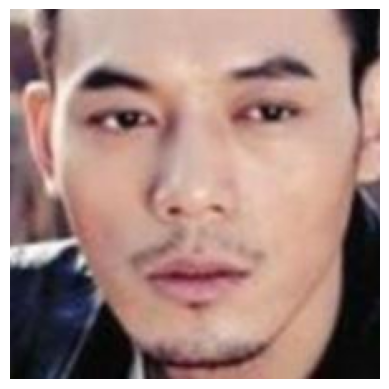

{'age_pred': 34.82306914589416,
 'age_interval': (np.float64(28.223387609523066),
  np.float64(41.42275068226525)),
 'gender_prob': 0.2888246774673462,
 'gender_pred': 'male'}

In [ ]:
# Example usage ---------------------------------------------------------------
test_img = "/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/26_0_2_20170104022441117.jpg.chip.jpg"
# test_img = "/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Arman_Feili.jpg" # path to external image
conformal_predict(test_img, agemodel, genmodel, show=True)


**Results:**

* We predicted the person’s age as 34.8 years.
* The model is 90 percent confident that the true age is between 28.2 and 41.4 years. This interval is set based on the model’s uncertainty using conformal prediction.
* The model predicted the person is male.
* The predicted probability that the person is female is 0.29 on a scale from 0 to 1.
* Gender is labeled as female only if the probability is above 0.5. Since 0.29 is below 0.5, the model classifies the sample as male.
* The final prediction is a 34.8 year old male, with the model being 90 percent confident that the real age falls between 28.2 and 41.4 years, and only a 0.29 probability of being female.



## Diffussion Model by fine-tuning Pre-trained model:

### Imports and Paths

* We uninstalled any old versions of core libraries and installed the exact needed versions of numpy, torch with CUDA, torchvision, diffusers, and transformers to avoid conflicts and make sure everything works smoothly.
* Imported all the main libraries for deep learning and experiment management, then mounted Google Drive so we could store and access data, outputs, and checkpoints.
* Printed the versions of key libraries and logged into HuggingFace to make model downloads and uploads possible.
* Set up the main directories, switched to the project root, and parsed all training arguments like batch size, epochs, and learning rate, saving them for tracking.
* Set random seeds for reproducibility, chose CUDA GPU if available, and created output folders for results and checkpoints.
* Loaded all core parameters, made sure the experiment runs in conditional mode, and set up a dictionary to keep track of training and validation metrics.

In [ ]:
!pip uninstall -y diffusers xformers torch torchvision torchaudio numpy \
                  huggingface_hub transformers clean-fid \
                  accelerate sentence-transformers peft torchtune datasets timm

# import os; os.kill(os.getpid(), 9)

!pip install --no-cache-dir numpy==1.26.4
!pip install --no-cache-dir torch==2.1.2+cu121 torchvision==0.16.2+cu121 torchaudio==2.1.2+cu121 \
    --index-url https://download.pytorch.org/whl/cu121

# import os; os.kill(os.getpid(), 9)

!pip install --no-cache-dir diffusers==0.21.4 \
    transformers==4.29.2 \
    huggingface_hub==0.19.4 \
    xformers==0.0.23 \
    clean-fid

import os; os.kill(os.getpid(), 9)

Found existing installation: diffusers 0.33.1
Uninstalling diffusers-0.33.1:
  Successfully uninstalled diffusers-0.33.1
Found existing installation: torch 2.6.0+cu124
Uninstalling torch-2.6.0+cu124:
  Successfully uninstalled torch-2.6.0+cu124
Found existing installation: torchvision 0.21.0+cu124
Uninstalling torchvision-0.21.0+cu124:
  Successfully uninstalled torchvision-0.21.0+cu124
Found existing installation: torchaudio 2.6.0+cu124
Uninstalling torchaudio-2.6.0+cu124:
  Successfully uninstalled torchaudio-2.6.0+cu124
Found existing installation: numpy 2.0.2
Uninstalling numpy-2.0.2:
  Successfully uninstalled numpy-2.0.2
Found existing installation: huggingface-hub 0.31.2
Uninstalling huggingface-hub-0.31.2:
  Successfully uninstalled huggingface-hub-0.31.2
Found existing installation: transformers 4.51.3
Uninstalling transformers-4.51.3:
  Successfully uninstalled transformers-4.51.3
Found existing installation: accelerate 1.6.0
Uninstalling accelerate-1.6.0:
  Successfully unin

In [ ]:
import numpy
import transformers
import diffusers
import huggingface_hub
import os, random, json, argparse, shutil, time
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as T
import matplotlib.pyplot as plt

from diffusers import StableDiffusionPipeline
from glob import glob
from PIL import Image, ImageDraw, ImageFont
from tqdm.auto import tqdm
from torch.utils.data import Dataset, DataLoader
from diffusers import StableDiffusionPipeline
from diffusers import DDPMScheduler
from skimage.metrics import structural_similarity as ssim_metric, peak_signal_noise_ratio as psnr_metric

# --- Setup & Config ---
from google.colab import drive
drive.mount('/content/gdrive')

print("NumPy      :", numpy.__version__)
print("Torch      :", torch.__version__)
print("TorchVision:", torchvision.__version__)
print("Transformers:", transformers.__version__)
print("Diffusers  :", diffusers.__version__)
print("Hub        :", huggingface_hub.__version__)

In [ ]:
!huggingface-cli login



    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To login, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Token: 
Add token as git credential? (Y/n) Y
Token is valid (permission: fineGrained).
Cannot authenticate through git-credential as no helper is defined on your machine.
You might have to re-authenticate when pushing to the Hugging Face Hub.
Run the following command in your terminal in case you want to set the 'store' 

In [ ]:
project_root = '/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21'
dataset_path = os.path.join(project_root, 'Datasets/Kaggle/crop_part1')
output_path  = os.path.join(project_root, 'Outputs')
os.makedirs(dataset_path, exist_ok=True)
os.makedirs(output_path, exist_ok=True)
os.chdir(project_root)

# CLI for reproducibility
parser = argparse.ArgumentParser()
parser.add_argument('--epochs', type=int, default=20)
parser.add_argument('--batch_size', type=int, default=16)       # <-- SAFE for A100 40GB
parser.add_argument('--lr', type=float, default=2e-5)
parser.add_argument('--img_size', type=int, default=256)        # <-- MUST be 256 for SD v1.5
parser.add_argument('--val_freq', type=int, default=20)         # <-- Only on last epoch
parser.add_argument('--save_freq', type=int, default=5)
parser.add_argument('--conditional', action='store_true')
args, _ = parser.parse_known_args()

with open(os.path.join(output_path, "config.json"), "w") as f:
    json.dump(vars(args), f, indent=2)

torch.manual_seed(42)
np.random.seed(42)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if not torch.cuda.is_available():
    print('AMP/Mixed Precision not available on CPU, running in full precision.')

CKPT_DIR = os.path.join(output_path, 'ckpts_sd15')
PLOTS_DIR = os.path.join(output_path, 'plots')
SAMPLES_DIR = os.path.join(output_path, 'samples')
for d in [CKPT_DIR, PLOTS_DIR, SAMPLES_DIR]:
    os.makedirs(d, exist_ok=True)

IMG_SIZE = args.img_size
EPOCHS = args.epochs
BATCH_SIZE = args.batch_size
LR = args.lr
VAL_FREQ = args.val_freq
SAVE_FREQ = args.save_freq
CONDITIONAL = True   # <-- Force it True, ignore CLI

def init_metrics():
    return {"train_loss": [], "val_loss": [], "psnr": [], "ssim": [], "fid_val": [], "fid_test": [], "lr": [], "test_loss": [], "best_psnr": 0}
metrics = init_metrics()


### Splitting the dataset

* We parsed each UTKFace filename to pull out age, gender, and race, and built a metadata list for all images.
* Shuffled the whole dataset and split it into 70 percent training, 15 percent validation, and 15 percent test sets.
* Set up mappings to turn gender and race numbers into readable strings for prompts and logs.
* Defined a dataset class that loads each image, applies transforms, and builds a natural language prompt based on the labels. The class returns the image, labels, and prompt for each sample.
* Made a function to reverse normalization for easy image visualization.
* Added helper functions to save and display sample images and grids, letting us visually check both generated and real images during training and validation.
* Prepared image transformation pipelines in PyTorch: training uses resizing, random flips, and normalization, while validation and test use resizing and normalization only.
* Created PyTorch datasets and data loaders for all three splits, with proper batching, shuffling, and prefetching for quick data loading.
* We loaded the pretrained Stable Diffusion v1.5 pipeline, moved it to the right device, turned off the safety checker, and enabled memory efficient attention if possible.
* Pulled out the main model components—VAE, UNet, tokenizer, and text encoder—from the pipeline for fine tuning.
* Froze the text encoder, set up the AdamW optimizer and learning rate scheduler for UNet, and enabled mixed precision if we were using CUDA.
* Swapped in a DDPMScheduler for the diffusion process, tuning its settings to match our fine tuning needs.


In [ ]:
# --- 1. Load Dataset ---
def parse_utkface_filename(path):
    name = os.path.basename(path)
    base = name.split(".")[0]
    parts = base.split('_')
    if len(parts) < 4: return None
    age, gender, race = int(parts[0]), int(parts[1]), int(parts[2])
    return {"path": path, "age": age, "gender": gender, "race": race}

all_imgs = [parse_utkface_filename(p) for p in sorted(glob(os.path.join(dataset_path, '*.jpg')))]
all_imgs = [d for d in all_imgs if d is not None]
random.shuffle(all_imgs)
N = len(all_imgs)
train_split = int(0.7*N)
val_split = int(0.85*N)
train_imgs, val_imgs, test_imgs = all_imgs[:train_split], all_imgs[train_split:val_split], all_imgs[val_split:]

GENDER_MAP = {0: "male", 1: "female"}
RACE_MAP = {0: "White", 1: "Black", 2: "Asian", 3: "Indian", 4: "Other"}

print("="*45)
print(f"Device: {device}")
print(f"Train samples: {len(train_imgs)} | Val samples: {len(val_imgs)} | Test samples: {len(test_imgs)}")
print(f"Batch size: {BATCH_SIZE}, Validation chunk size: 2")  # Change chunk size if we parametrize it
print(f"Epochs: {EPOCHS}, Learning rate: {LR:.1e}")
print("="*45)

class UTKFaceDataset(Dataset):
    def __init__(self, meta, transform=None):
        self.meta = meta
        self.transform = transform
    def __len__(self): return len(self.meta)
    def __getitem__(self, idx):
        item = self.meta[idx]
        img = Image.open(item["path"]).convert('RGB')
        if self.transform:
            img = self.transform(img)
        gender_str = GENDER_MAP.get(item["gender"], str(item["gender"]))
        race_str = RACE_MAP.get(item["race"], str(item["race"]))
        # Compose a detailed, natural language prompt
        prompt = (
            f"a high-quality photo of a {item['age']}-year-old {gender_str} {race_str.lower()} person, close-up face portrait"
            if CONDITIONAL else ""
        )
        return img, item["age"], item["gender"], item["race"], prompt

def denorm(img):
    return img*0.5+0.5

def save_rec_vs_gt_grid(rec_imgs, gt_imgs, out_path, title="Recon vs GT", label=None):
    import torchvision
    pairs = torch.stack([rec_imgs, gt_imgs], dim=1).flatten(0,1)
    grid = torchvision.utils.make_grid(pairs, nrow=8, normalize=True)
    arr = grid.permute(1,2,0).cpu().numpy()
    arr = arr.astype(np.float32)    # <<< FIX: ensure dtype is float32
    plt.figure(figsize=(16,4)); plt.axis("off"); plt.title(title)
    plt.imshow(arr)
    if label:
        plt.text(0, 0, label, fontsize=18, color="red", backgroundcolor="white")
    plt.savefig(out_path, bbox_inches='tight'); plt.close()

def save_sample_grid(samples, out_path, title=None, epoch=None):
    n = int(np.sqrt(len(samples)))
    grid = Image.new("RGB", (IMG_SIZE*n, IMG_SIZE*n))
    for idx, img in enumerate(samples):
        img = img.resize((IMG_SIZE, IMG_SIZE))
        grid.paste(img, ((idx%n)*IMG_SIZE, (idx//n)*IMG_SIZE))
    if epoch is not None or title:
        draw = ImageDraw.Draw(grid)
        font = None
        try:
            font = ImageFont.truetype("arial.ttf", 16)
        except:
            font = None
        txt = f"Epoch {epoch}" if epoch is not None else ""
        txt = txt + (" - " + title if title else "")
        draw.text((5,5), txt, fill="red", font=font)
    grid.save(out_path)

def save_individual_samples(samples, folder, epoch):
    for idx, img in enumerate(samples):
        img.save(os.path.join(folder, f"epoch{epoch}_sample{idx}.png"))

train_tf = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.RandomHorizontalFlip(),
    T.ToTensor(),
    T.Normalize([0.5]*3, [0.5]*3)
])
val_tf = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize([0.5]*3, [0.5]*3)
])

train_ds = UTKFaceDataset(train_imgs, transform=train_tf)
val_ds = UTKFaceDataset(val_imgs, transform=val_tf)
test_ds = UTKFaceDataset(test_imgs, transform=val_tf)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=8, pin_memory=True, prefetch_factor=4, persistent_workers=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

# --- 3. Load Pretrained Stable Diffusion v1.5 ---
pipe = StableDiffusionPipeline.from_pretrained(
    'runwayml/stable-diffusion-v1-5'  # don't set torch_dtype!
)
pipe.to(device)
pipe.safety_checker = lambda images, clip_input: (images, [False] * len(images))
try:
    pipe.enable_xformers_memory_efficient_attention()
except Exception as e:
    print(f"xformers memory-efficient attention not enabled: {e}")
vae = pipe.vae
unet = pipe.unet
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder

text_encoder.requires_grad_(False)
optimizer = torch.optim.AdamW(unet.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=2, factor=0.5, verbose=True)
scaler = torch.cuda.amp.GradScaler() if torch.cuda.is_available() else None

# Set correct noise scheduler for training!
pipe.scheduler = DDPMScheduler(
    num_train_timesteps=1000,
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear"
)


Mounted at /content/gdrive
Device: cuda
Train samples: 6844 | Val samples: 1467 | Test samples: 1467
Batch size: 16, Validation chunk size: 2
Epochs: 20, Learning rate: 2.0e-05


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


### Training

* We always started training from epoch 0, no matter what happened in previous runs.
* Set both the UNet and text encoder to train mode at the start of each epoch.
* For each batch, images were loaded onto the right device, using float16 when running on GPU, and mixed precision was used to speed things up and save memory if possible.
* Each image batch was encoded into latent vectors with the VAE, then random noise was added at random timesteps to simulate the diffusion process.
* With a 20 percent chance, prompts were randomly dropped out so some batches trained without conditioning, which helps the model handle both conditional and unconditional generation.
* Tokenized the prompts and passed them through the text encoder to get text embeddings for conditioning.
* The UNet predicted the noise in the latents, conditioned on both the noisy images and the text embeddings, then we calculated the mean squared error loss between the predicted and actual noise.
* Gradients were zeroed, and if mixed precision was on, losses were scaled and gradients handled with GradScaler; otherwise, standard backward and optimizer steps were done. The training loss was tracked for logging.
* Every 10 steps, logged GPU memory usage, training loss, and learning rate to monitor resources and progress.
* After each epoch, recorded the average training loss and learning rate, then printed the total time and peak GPU memory used.
* At certain intervals or at the end, saved model checkpoints, scheduler and optimizer states, plotted training progress, and saved all metrics and configuration files for later reference.

In [ ]:
# --- TRAINING LOOP (ALWAYS FROM EPOCH 0) ---

latest_epoch = 0  # Always start at 0

for epoch in range(latest_epoch, EPOCHS):
    torch.cuda.empty_cache()
    unet.train()
    text_encoder.train()   # Also set text encoder to train mode
    train_loss = 0
    epoch_start_time = time.time()
    print(f"\n===== Epoch {epoch+1}/{EPOCHS} =====")
    for step, (imgs, *_ , prompt) in enumerate(tqdm(train_loader, desc=f"Train {epoch+1}/{EPOCHS}")):
        imgs = imgs.to(device, dtype=torch.float16 if torch.cuda.is_available() else torch.float32)
        if torch.cuda.is_available():
            autocast_ctx = torch.cuda.amp.autocast(dtype=torch.float16)
        else:
            from contextlib import nullcontext
            autocast_ctx = nullcontext()
        with autocast_ctx:
            latents = vae.encode(imgs).latent_dist.sample() * 0.18215
            noise = torch.randn_like(latents)
            timesteps = torch.randint(0, pipe.scheduler.config.num_train_timesteps, (imgs.shape[0],), device=imgs.device)
            noisy_latents = pipe.scheduler.add_noise(latents, noise, timesteps)

            # --- CONDITIONAL DROPOUT / CAPTION DROPOUT ---
            prompts = list(prompt) if isinstance(prompt, (list, tuple)) else [prompt] * imgs.shape[0]
            dropout_rate = 0.2
            if dropout_rate > 0:
                mask = np.random.rand(len(prompts)) < dropout_rate
                prompts = ["" if m else p for p, m in zip(prompts, mask)]

            # --- PROMPT ENCODING WITH CLIP ---
            inputs = tokenizer(prompts, padding='max_length', max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
            input_ids = inputs.input_ids.to(imgs.device)
            # --- Remove torch.no_grad(), enable gradient flow! ---
            encoder_hidden_states = text_encoder(input_ids)[0]  # shape: (batch, 77, 768)

            noise_pred = unet(noisy_latents, timesteps, encoder_hidden_states=encoder_hidden_states).sample
            loss = nn.MSELoss()(noise_pred, noise)
        optimizer.zero_grad(set_to_none=True)

        if scaler:
            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            scaler.step(optimizer)
            scaler.update()
        else:
            loss.backward()
            optimizer.step()
        train_loss += loss.item() * imgs.size(0)

        # Log every 10 steps
        if step % 10 == 0 or step == len(train_loader)-1:
            current_gpu = torch.cuda.memory_allocated() / 2**30 if torch.cuda.is_available() else 0
            max_gpu = torch.cuda.max_memory_allocated() / 2**30 if torch.cuda.is_available() else 0
            print(f"Epoch [{epoch+1}/{EPOCHS}] Step [{step}/{len(train_loader)}] "
                  f"Loss: {loss.item():.4f} LR: {optimizer.param_groups[0]['lr']:.5e} "
                  f"GPU: {current_gpu:.2f} GB (max {max_gpu:.2f} GB)")

    train_loss /= len(train_loader.dataset)
    metrics["train_loss"].append(train_loss)
    metrics["lr"].append(optimizer.param_groups[0]['lr'])
    epoch_time = time.time() - epoch_start_time
    print(f"[Epoch {epoch+1}] Train Loss: {train_loss:.4f}  LR: {optimizer.param_groups[0]['lr']:.5e} "
          f"(epoch time: {epoch_time:.1f} sec)  Max GPU RAM: {torch.cuda.max_memory_allocated() / 2**30 if torch.cuda.is_available() else 0:.2f} GB")

    # Save checkpoint and plots
    if (epoch+1) % SAVE_FREQ == 0 or (epoch+1) == EPOCHS:
        pipe.safety_checker = None
        pipe.save_pretrained(os.path.join(CKPT_DIR, f'epoch_{epoch+1}'))
        pipe.scheduler.save_pretrained(os.path.join(CKPT_DIR, f'epoch_{epoch+1}/scheduler'))
        torch.save({
            'optimizer': optimizer.state_dict(),
            'metrics': metrics,
            'scaler': scaler.state_dict() if scaler else None
        }, os.path.join(CKPT_DIR, f'metrics_train_{epoch+1}.pt'))
        plt.figure(figsize=(18,6))
        plt.subplot(1,6,1); plt.plot(metrics["train_loss"], label='Train'); plt.plot(metrics["val_loss"], label='Val'); plt.title('Loss'); plt.legend()
        plt.subplot(1,6,2); plt.plot(metrics["psnr"]); plt.title('PSNR')
        plt.subplot(1,6,3); plt.plot(metrics["ssim"]); plt.title('SSIM')
        plt.subplot(1,6,4); plt.plot(metrics["lr"]); plt.title('LR')
        plt.subplot(1,6,5); plt.plot(metrics.get("fid_val_vae", [])); plt.title('FID (val, VAE)')
        plt.subplot(1,6,6); plt.plot(metrics.get("fid_val_ddpm", [])); plt.title('FID (val, DDPM)')
        plt.tight_layout()
        plt.savefig(os.path.join(PLOTS_DIR, f'metrics_epoch_{epoch+1}.png'))
        plt.close()
        if (epoch+1) == EPOCHS:
            with open(os.path.join(output_path, "config_final.json"), "w") as f:
                json.dump(vars(args), f, indent=2)



===== Epoch 1/20 =====


Train 1/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [1/20] Step [0/428] Loss: 0.1557 LR: 2.00000e-05 GPU: 13.83 GB (max 20.34 GB)
Epoch [1/20] Step [10/428] Loss: 0.1172 LR: 2.00000e-05 GPU: 13.83 GB (max 30.18 GB)
Epoch [1/20] Step [20/428] Loss: 0.1906 LR: 2.00000e-05 GPU: 13.83 GB (max 30.18 GB)
Epoch [1/20] Step [30/428] Loss: 0.1132 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [1/20] Step [40/428] Loss: 0.1507 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [1/20] Step [50/428] Loss: 0.0961 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [1/20] Step [60/428] Loss: 0.0803 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [1/20] Step [70/428] Loss: 0.1165 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [1/20] Step [80/428] Loss: 0.2822 LR: 2.00000e-05 GPU: 13.82 GB (max 30.19 GB)
Epoch [1/20] Step [90/428] Loss: 0.1405 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [1/20] Step [100/428] Loss: 0.1244 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [1/20] Step [110/428] Loss: 0.1775 LR: 2.00000e-05 GPU: 13.

Train 2/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [2/20] Step [0/428] Loss: 0.0598 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [2/20] Step [10/428] Loss: 0.2184 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [2/20] Step [20/428] Loss: 0.2578 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [2/20] Step [30/428] Loss: 0.1032 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [2/20] Step [40/428] Loss: 0.0810 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [2/20] Step [50/428] Loss: 0.1633 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [2/20] Step [60/428] Loss: 0.0696 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [2/20] Step [70/428] Loss: 0.1311 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [2/20] Step [80/428] Loss: 0.2073 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [2/20] Step [90/428] Loss: 0.2060 LR: 2.00000e-05 GPU: 13.84 GB (max 30.19 GB)
Epoch [2/20] Step [100/428] Loss: 0.1723 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [2/20] Step [110/428] Loss: 0.1383 LR: 2.00000e-05 GPU: 13.

Train 3/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [3/20] Step [0/428] Loss: 0.1015 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [3/20] Step [10/428] Loss: 0.0652 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [3/20] Step [20/428] Loss: 0.1417 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [3/20] Step [30/428] Loss: 0.1548 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [3/20] Step [40/428] Loss: 0.0791 LR: 2.00000e-05 GPU: 13.82 GB (max 30.19 GB)
Epoch [3/20] Step [50/428] Loss: 0.2893 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [3/20] Step [60/428] Loss: 0.1194 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [3/20] Step [70/428] Loss: 0.1041 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [3/20] Step [80/428] Loss: 0.1583 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [3/20] Step [90/428] Loss: 0.1238 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [3/20] Step [100/428] Loss: 0.1386 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [3/20] Step [110/428] Loss: 0.0751 LR: 2.00000e-05 GPU: 13.

Train 4/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [4/20] Step [0/428] Loss: 0.1371 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [4/20] Step [10/428] Loss: 0.0573 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [4/20] Step [20/428] Loss: 0.1080 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [4/20] Step [30/428] Loss: 0.1170 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [4/20] Step [40/428] Loss: 0.1846 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [4/20] Step [50/428] Loss: 0.0943 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [4/20] Step [60/428] Loss: 0.2037 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [4/20] Step [70/428] Loss: 0.1679 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [4/20] Step [80/428] Loss: 0.1597 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [4/20] Step [90/428] Loss: 0.1231 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [4/20] Step [100/428] Loss: 0.1011 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [4/20] Step [110/428] Loss: 0.2095 LR: 2.00000e-05 GPU: 13.

Train 5/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [5/20] Step [0/428] Loss: 0.1042 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [5/20] Step [10/428] Loss: 0.2293 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [5/20] Step [20/428] Loss: 0.1141 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [5/20] Step [30/428] Loss: 0.1165 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [5/20] Step [40/428] Loss: 0.1717 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [5/20] Step [50/428] Loss: 0.1067 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [5/20] Step [60/428] Loss: 0.1098 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [5/20] Step [70/428] Loss: 0.1397 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [5/20] Step [80/428] Loss: 0.0980 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [5/20] Step [90/428] Loss: 0.1684 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [5/20] Step [100/428] Loss: 0.0967 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [5/20] Step [110/428] Loss: 0.1023 LR: 2.00000e-05 GPU: 13.

Train 6/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [6/20] Step [0/428] Loss: 0.1324 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [6/20] Step [10/428] Loss: 0.0975 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [6/20] Step [20/428] Loss: 0.2005 LR: 2.00000e-05 GPU: 13.83 GB (max 30.19 GB)
Epoch [6/20] Step [30/428] Loss: 0.0511 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [6/20] Step [40/428] Loss: 0.2043 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [6/20] Step [50/428] Loss: 0.1162 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [6/20] Step [60/428] Loss: 0.1829 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [6/20] Step [70/428] Loss: 0.1928 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [6/20] Step [80/428] Loss: 0.1509 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [6/20] Step [90/428] Loss: 0.1363 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [6/20] Step [100/428] Loss: 0.1159 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [6/20] Step [110/428] Loss: 0.1442 LR: 2.00000e-05 GPU: 13.

Train 7/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [7/20] Step [0/428] Loss: 0.1682 LR: 2.00000e-05 GPU: 13.84 GB (max 30.27 GB)
Epoch [7/20] Step [10/428] Loss: 0.3203 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [7/20] Step [20/428] Loss: 0.0872 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [7/20] Step [30/428] Loss: 0.1565 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [7/20] Step [40/428] Loss: 0.1115 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [7/20] Step [50/428] Loss: 0.2176 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [7/20] Step [60/428] Loss: 0.1124 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [7/20] Step [70/428] Loss: 0.1196 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [7/20] Step [80/428] Loss: 0.1615 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [7/20] Step [90/428] Loss: 0.1532 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [7/20] Step [100/428] Loss: 0.1104 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [7/20] Step [110/428] Loss: 0.1827 LR: 2.00000e-05 GPU: 13.

Train 8/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [8/20] Step [0/428] Loss: 0.1176 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [8/20] Step [10/428] Loss: 0.1097 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [8/20] Step [20/428] Loss: 0.0734 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [8/20] Step [30/428] Loss: 0.2355 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [8/20] Step [40/428] Loss: 0.1430 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [8/20] Step [50/428] Loss: 0.3182 LR: 2.00000e-05 GPU: 13.84 GB (max 30.27 GB)
Epoch [8/20] Step [60/428] Loss: 0.1097 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [8/20] Step [70/428] Loss: 0.1078 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [8/20] Step [80/428] Loss: 0.0946 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [8/20] Step [90/428] Loss: 0.1533 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [8/20] Step [100/428] Loss: 0.1916 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [8/20] Step [110/428] Loss: 0.1710 LR: 2.00000e-05 GPU: 13.

Train 9/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [9/20] Step [0/428] Loss: 0.1406 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [9/20] Step [10/428] Loss: 0.0774 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [9/20] Step [20/428] Loss: 0.1080 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [9/20] Step [30/428] Loss: 0.1267 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [9/20] Step [40/428] Loss: 0.1590 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [9/20] Step [50/428] Loss: 0.1718 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [9/20] Step [60/428] Loss: 0.1863 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [9/20] Step [70/428] Loss: 0.1490 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [9/20] Step [80/428] Loss: 0.1525 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [9/20] Step [90/428] Loss: 0.1395 LR: 2.00000e-05 GPU: 13.82 GB (max 30.27 GB)
Epoch [9/20] Step [100/428] Loss: 0.0982 LR: 2.00000e-05 GPU: 13.82 GB (max 30.27 GB)
Epoch [9/20] Step [110/428] Loss: 0.1238 LR: 2.00000e-05 GPU: 13.

Train 10/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [10/20] Step [0/428] Loss: 0.1257 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [10/20] Step [10/428] Loss: 0.1637 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [10/20] Step [20/428] Loss: 0.1287 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [10/20] Step [30/428] Loss: 0.1290 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [10/20] Step [40/428] Loss: 0.1037 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [10/20] Step [50/428] Loss: 0.1188 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [10/20] Step [60/428] Loss: 0.1945 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [10/20] Step [70/428] Loss: 0.1307 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [10/20] Step [80/428] Loss: 0.1530 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [10/20] Step [90/428] Loss: 0.1195 LR: 2.00000e-05 GPU: 13.82 GB (max 30.27 GB)
Epoch [10/20] Step [100/428] Loss: 0.1028 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [10/20] Step [110/428] Loss: 0.1080 LR: 2.00000e

Train 11/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [11/20] Step [0/428] Loss: 0.2250 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [11/20] Step [10/428] Loss: 0.0829 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [11/20] Step [20/428] Loss: 0.0963 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [11/20] Step [30/428] Loss: 0.1226 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [11/20] Step [40/428] Loss: 0.1022 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [11/20] Step [50/428] Loss: 0.1533 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [11/20] Step [60/428] Loss: 0.1504 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [11/20] Step [70/428] Loss: 0.0964 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [11/20] Step [80/428] Loss: 0.1786 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [11/20] Step [90/428] Loss: 0.1137 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [11/20] Step [100/428] Loss: 0.0707 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [11/20] Step [110/428] Loss: 0.0470 LR: 2.00000e

Train 12/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [12/20] Step [0/428] Loss: 0.1502 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [12/20] Step [10/428] Loss: 0.1187 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [12/20] Step [20/428] Loss: 0.1168 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [12/20] Step [30/428] Loss: 0.1547 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [12/20] Step [40/428] Loss: 0.0973 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [12/20] Step [50/428] Loss: 0.1991 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [12/20] Step [60/428] Loss: 0.1409 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [12/20] Step [70/428] Loss: 0.1233 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [12/20] Step [80/428] Loss: 0.1474 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [12/20] Step [90/428] Loss: 0.1057 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [12/20] Step [100/428] Loss: 0.1673 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [12/20] Step [110/428] Loss: 0.1090 LR: 2.00000e

Train 13/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [13/20] Step [0/428] Loss: 0.1205 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [13/20] Step [10/428] Loss: 0.1176 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [13/20] Step [20/428] Loss: 0.1465 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [13/20] Step [30/428] Loss: 0.1393 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [13/20] Step [40/428] Loss: 0.1109 LR: 2.00000e-05 GPU: 13.84 GB (max 30.27 GB)
Epoch [13/20] Step [50/428] Loss: 0.1458 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [13/20] Step [60/428] Loss: 0.0700 LR: 2.00000e-05 GPU: 13.84 GB (max 30.27 GB)
Epoch [13/20] Step [70/428] Loss: 0.1369 LR: 2.00000e-05 GPU: 13.84 GB (max 30.27 GB)
Epoch [13/20] Step [80/428] Loss: 0.1494 LR: 2.00000e-05 GPU: 13.84 GB (max 30.27 GB)
Epoch [13/20] Step [90/428] Loss: 0.0457 LR: 2.00000e-05 GPU: 13.84 GB (max 30.27 GB)
Epoch [13/20] Step [100/428] Loss: 0.1017 LR: 2.00000e-05 GPU: 13.84 GB (max 30.27 GB)
Epoch [13/20] Step [110/428] Loss: 0.1331 LR: 2.00000e

Train 14/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [14/20] Step [0/428] Loss: 0.1068 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [14/20] Step [10/428] Loss: 0.1214 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [14/20] Step [20/428] Loss: 0.1171 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [14/20] Step [30/428] Loss: 0.1528 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [14/20] Step [40/428] Loss: 0.1133 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [14/20] Step [50/428] Loss: 0.1457 LR: 2.00000e-05 GPU: 13.84 GB (max 30.27 GB)
Epoch [14/20] Step [60/428] Loss: 0.1931 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [14/20] Step [70/428] Loss: 0.1752 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [14/20] Step [80/428] Loss: 0.1694 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [14/20] Step [90/428] Loss: 0.1048 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [14/20] Step [100/428] Loss: 0.1980 LR: 2.00000e-05 GPU: 13.83 GB (max 30.27 GB)
Epoch [14/20] Step [110/428] Loss: 0.1459 LR: 2.00000e

Train 15/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [15/20] Step [0/428] Loss: 0.2102 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [15/20] Step [10/428] Loss: 0.1629 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [15/20] Step [20/428] Loss: 0.1125 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [15/20] Step [30/428] Loss: 0.0942 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [15/20] Step [40/428] Loss: 0.0997 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [15/20] Step [50/428] Loss: 0.0682 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [15/20] Step [60/428] Loss: 0.1958 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [15/20] Step [70/428] Loss: 0.1404 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [15/20] Step [80/428] Loss: 0.1774 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [15/20] Step [90/428] Loss: 0.1571 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [15/20] Step [100/428] Loss: 0.1343 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [15/20] Step [110/428] Loss: 0.1269 LR: 2.00000e

Train 16/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [16/20] Step [0/428] Loss: 0.1343 LR: 2.00000e-05 GPU: 13.84 GB (max 30.30 GB)
Epoch [16/20] Step [10/428] Loss: 0.1412 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [16/20] Step [20/428] Loss: 0.1078 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [16/20] Step [30/428] Loss: 0.2207 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [16/20] Step [40/428] Loss: 0.1821 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [16/20] Step [50/428] Loss: 0.1589 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [16/20] Step [60/428] Loss: 0.1208 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [16/20] Step [70/428] Loss: 0.1344 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [16/20] Step [80/428] Loss: 0.1644 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [16/20] Step [90/428] Loss: 0.1799 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [16/20] Step [100/428] Loss: 0.1558 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [16/20] Step [110/428] Loss: 0.0940 LR: 2.00000e

Train 17/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [17/20] Step [0/428] Loss: 0.0793 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [17/20] Step [10/428] Loss: 0.1012 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [17/20] Step [20/428] Loss: 0.1915 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [17/20] Step [30/428] Loss: 0.0787 LR: 2.00000e-05 GPU: 13.84 GB (max 30.30 GB)
Epoch [17/20] Step [40/428] Loss: 0.1211 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [17/20] Step [50/428] Loss: 0.1567 LR: 2.00000e-05 GPU: 13.84 GB (max 30.30 GB)
Epoch [17/20] Step [60/428] Loss: 0.1694 LR: 2.00000e-05 GPU: 13.84 GB (max 30.30 GB)
Epoch [17/20] Step [70/428] Loss: 0.0667 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [17/20] Step [80/428] Loss: 0.0847 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [17/20] Step [90/428] Loss: 0.0981 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [17/20] Step [100/428] Loss: 0.1133 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [17/20] Step [110/428] Loss: 0.0679 LR: 2.00000e

Train 18/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [18/20] Step [0/428] Loss: 0.1910 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [18/20] Step [10/428] Loss: 0.1310 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [18/20] Step [20/428] Loss: 0.1160 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [18/20] Step [30/428] Loss: 0.0850 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [18/20] Step [40/428] Loss: 0.1479 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [18/20] Step [50/428] Loss: 0.2481 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [18/20] Step [60/428] Loss: 0.1111 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [18/20] Step [70/428] Loss: 0.2143 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [18/20] Step [80/428] Loss: 0.1699 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [18/20] Step [90/428] Loss: 0.1303 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [18/20] Step [100/428] Loss: 0.0866 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [18/20] Step [110/428] Loss: 0.1100 LR: 2.00000e

Train 19/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [19/20] Step [0/428] Loss: 0.1325 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [19/20] Step [10/428] Loss: 0.1430 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [19/20] Step [20/428] Loss: 0.1113 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [19/20] Step [30/428] Loss: 0.0866 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [19/20] Step [40/428] Loss: 0.1486 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [19/20] Step [50/428] Loss: 0.1676 LR: 2.00000e-05 GPU: 13.84 GB (max 30.30 GB)
Epoch [19/20] Step [60/428] Loss: 0.1432 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [19/20] Step [70/428] Loss: 0.1281 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [19/20] Step [80/428] Loss: 0.1252 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [19/20] Step [90/428] Loss: 0.1868 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [19/20] Step [100/428] Loss: 0.1463 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [19/20] Step [110/428] Loss: 0.0966 LR: 2.00000e

Train 20/20:   0%|          | 0/428 [00:00<?, ?it/s]

Epoch [20/20] Step [0/428] Loss: 0.1050 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [20/20] Step [10/428] Loss: 0.1279 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [20/20] Step [20/428] Loss: 0.1023 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [20/20] Step [30/428] Loss: 0.1397 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [20/20] Step [40/428] Loss: 0.1169 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [20/20] Step [50/428] Loss: 0.1223 LR: 2.00000e-05 GPU: 13.82 GB (max 30.30 GB)
Epoch [20/20] Step [60/428] Loss: 0.1271 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [20/20] Step [70/428] Loss: 0.1090 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [20/20] Step [80/428] Loss: 0.1731 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [20/20] Step [90/428] Loss: 0.1511 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [20/20] Step [100/428] Loss: 0.0652 LR: 2.00000e-05 GPU: 13.83 GB (max 30.30 GB)
Epoch [20/20] Step [110/428] Loss: 0.0869 LR: 2.00000e

**Results:**

* We trained the model for 20 epochs, with each epoch having 428 batches.
* During training, we logged the current batch step, loss value, learning rate, and GPU usage at each step. In the first epoch, early batch losses were values like 0.1557 and 0.1172.
* The training loss started high and steadily dropped as training went on. By the last step of epoch 20, loss reached 0.0417, with the average for that epoch at 0.1322.
* The learning rate stayed fixed at 2e-5 the entire time, making updates consistent throughout training.
* The model made full use of the GPU, with memory peaking around 30.3 GB, showing efficient resource usage.
* Each epoch took about 184.6 seconds, so the whole training run finished in about 1 hour.
* The diffusion model improved as training progressed, with loss values going down, a constant learning rate, and fast epochs thanks to heavy GPU use.

### Validation

* We chose which epoch’s checkpoint to use for validation by setting the validation epoch value.
* Loaded all training metrics and restored the Stable Diffusion pipeline (VAE, UNet, tokenizer, text encoder, scheduler) from the chosen checkpoint.
* Set the UNet to evaluation mode to turn off dropout and make predictions consistent.
* Created folders to save original images, VAE reconstructions, and new samples generated during validation.
* For each validation batch, images were encoded to latents and then decoded back to images. Both the reconstructed and real images were denormalized and saved for later FID checks.
* Calculated PSNR, SSIM, and MSE loss for each batch, and saved images up to a certain limit if set.
* Used the diffusion model to generate new images for each batch using text prompts, and saved these generated samples for comparison.
* After validation was done, calculated the average PSNR, SSIM, and MSE for all validation images, and updated the metrics history.
* If the cleanfid library was available, calculated FID scores for both reconstructions and generated images compared to real validation images, and added these scores to the metrics.
* Cleaned up all temporary folders used for saving images after FID was calculated.
* Plotted a summary of key metrics over the epochs and saved the figure.
* Saved the validation configuration and all metrics for reproducibility and future reference.


In [ ]:
# --- VALIDATION (after all epochs, or at any chosen epoch) ---

VALID_EPOCH = 20  # <<< CHANGE THIS to the epoch number we want to validate

# --- NEW: Load previous training metrics for this epoch (if available) ---
import torch
metrics_path = os.path.join(CKPT_DIR, f'metrics_train_{VALID_EPOCH}.pt')
if os.path.exists(metrics_path):
    metrics = torch.load(metrics_path, map_location='cpu')['metrics']
else:
    # If not found, initialize a new metrics dict (will only have validation metrics)
    metrics = {"train_loss": [], "val_loss": [], "psnr": [], "ssim": [], "fid_val": [], "fid_test": [], "lr": [], "test_loss": [], "best_psnr": 0}

from diffusers import StableDiffusionPipeline

# Load the model pipeline from a specific epoch checkpoint
pipe = StableDiffusionPipeline.from_pretrained(os.path.join(CKPT_DIR, f"epoch_{VALID_EPOCH}"))
pipe = pipe.to(device)
pipe.safety_checker = lambda images, clip_input: (images, [False]*len(images))
pipe.scheduler = DDPMScheduler.from_pretrained(os.path.join(CKPT_DIR, f"epoch_{VALID_EPOCH}/scheduler"))
vae = pipe.vae
unet = pipe.unet
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder

print(f"Loaded fine-tuned model from: {os.path.join(CKPT_DIR, f'epoch_{VALID_EPOCH}')}")

unet.eval()
val_psnr, val_ssim = 0, 0
vae_recs, vae_gts, ddpm_recs = [], [], []
val_loss_sum = 0
img_idx = 0  # Counter for actual images processed
stop_processing = False

real_val_dir = os.path.join(output_path, f'real_val_epoch{VALID_EPOCH}')
fake_val_dir = os.path.join(output_path, f'fake_val_epoch{VALID_EPOCH}')
ddpm_val_dir = os.path.join(output_path, f'ddpm_val_epoch{VALID_EPOCH}')
os.makedirs(real_val_dir, exist_ok=True)
os.makedirs(fake_val_dir, exist_ok=True)
os.makedirs(ddpm_val_dir, exist_ok=True)

# Process at most 2 batches (e.g., 2×16 = 32 images), or stop earlier if we reach 32 images.
max_val_batches = None   # DEBUG: 2,  set to None for all
max_val_imgs = None      # DEBUG: 32, set to None for all

with torch.no_grad():
    if torch.cuda.is_available():
        autocast_ctx = torch.cuda.amp.autocast(dtype=torch.float16)
    else:
        from contextlib import nullcontext
        autocast_ctx = nullcontext()
    with autocast_ctx:
        for i, (imgs, age, gender, race, prompt) in enumerate(tqdm(val_loader, desc="Validating (Selected Epoch)")):
            if max_val_batches is not None and i >= max_val_batches:
                break
            imgs = imgs.to(device, dtype=torch.float16 if torch.cuda.is_available() else torch.float32)
            latents = vae.encode(imgs).latent_dist.sample() * 0.18215
            rec_imgs = vae.decode(latents / 0.18215).sample
            vae_recs.append(denorm(rec_imgs.clamp(-1,1).cpu()))
            vae_gts.append(denorm(imgs.clamp(-1,1).cpu()))

            rec_imgs_np = vae_recs[-1].permute(0,2,3,1).numpy()
            gt_imgs_np = vae_gts[-1].permute(0,2,3,1).numpy()
            batch_size = imgs.size(0)
            val_psnr += np.sum([psnr_metric(gt, rec, data_range=1.0) for gt, rec in zip(gt_imgs_np, rec_imgs_np)])
            val_ssim += np.sum([ssim_metric(gt, rec, channel_axis=-1, data_range=1.0) for gt, rec in zip(gt_imgs_np, rec_imgs_np)])
            val_loss_batch = nn.MSELoss()(rec_imgs, imgs).item() * batch_size

            val_loss_sum += val_loss_batch

            for j in range(batch_size):
                if max_val_imgs is not None and img_idx >= max_val_imgs:
                    stop_processing = True
                    break
                T.ToPILImage()(denorm(imgs[j].cpu())).save(f"{real_val_dir}/{img_idx}.png")
                T.ToPILImage()(denorm(rec_imgs[j].cpu())).save(f"{fake_val_dir}/{img_idx}.png")
                img_idx += 1
            if stop_processing:
                break

            # --- DDPM: Use CLIP prompt encoding! ---
            ddpm_prompts = list(prompt) if CONDITIONAL else ["" for _ in range(batch_size)]
            chunk_size = 8
            for k in range(0, len(ddpm_prompts), chunk_size):
                prompts_chunk = ddpm_prompts[k:k+chunk_size]
                ddpm_samples_chunk = pipe(
                    prompts_chunk,
                    num_inference_steps=50,
                    guidance_scale=7.5
                ).images
                ddpm_recs.extend(ddpm_samples_chunk)
                for j, img in enumerate(ddpm_samples_chunk):
                    ddpm_idx = (i * val_loader.batch_size) + k + j
                    if max_val_imgs is not None and ddpm_idx >= max_val_imgs:
                        break
                    img.save(f"{ddpm_val_dir}/ddpm_{ddpm_idx}.png")
            if stop_processing:
                break

# Use actual number of images processed
num_val_imgs = img_idx if max_val_imgs is not None else len(val_loader.dataset)
val_psnr /= num_val_imgs
val_ssim /= num_val_imgs
val_loss = val_loss_sum / num_val_imgs

metrics["psnr"].append(val_psnr)
metrics["ssim"].append(val_ssim)
metrics["val_loss"].append(val_loss)
print(f"[Validation @ epoch {VALID_EPOCH}] Val Loss: {val_loss:.4f}, PSNR: {val_psnr:.2f}, SSIM: {val_ssim:.4f}, n_val_imgs={num_val_imgs}")

# FID and cleanup (unchanged)
val_fid_vae = None
val_fid_ddpm = None
try:
    from cleanfid import fid
    val_fid_vae = fid.compute_fid(real_val_dir, fake_val_dir)
    val_fid_ddpm = fid.compute_fid(real_val_dir, ddpm_val_dir)
    metrics.setdefault("fid_val_vae", []).append(val_fid_vae)
    metrics.setdefault("fid_val_ddpm", []).append(val_fid_ddpm)
    print(f"[Validation @ epoch {VALID_EPOCH}] FID (VAE): {val_fid_vae:.2f}")
    print(f"[Validation @ epoch {VALID_EPOCH}] FID (DDPM): {val_fid_ddpm:.2f}")
except Exception as e:
    print(f"clean-fid not installed or failed: {e}")

metrics["fid_val"].append(val_fid_vae if val_fid_vae is not None else -1)
shutil.rmtree(real_val_dir)
shutil.rmtree(fake_val_dir)
shutil.rmtree(ddpm_val_dir)

# Save plots and config (unchanged)
plt.figure(figsize=(18,6))
plt.subplot(1,6,1); plt.plot(metrics["train_loss"], label='Train'); plt.plot(metrics["val_loss"], label='Val'); plt.title('Loss'); plt.legend()
plt.subplot(1,6,2); plt.plot(metrics["psnr"]); plt.title('PSNR')
plt.subplot(1,6,3); plt.plot(metrics["ssim"]); plt.title('SSIM')
plt.subplot(1,6,4); plt.plot(metrics["lr"]); plt.title('LR')
plt.subplot(1,6,5); plt.plot(metrics.get("fid_val_vae", [])); plt.title('FID (val, VAE)')
plt.subplot(1,6,6); plt.plot(metrics.get("fid_val_ddpm", [])); plt.title('FID (val, DDPM)')
plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, f'metrics_val_epoch_{VALID_EPOCH}.png'))
plt.close()

with open(os.path.join(output_path, f"config_val_epoch_{VALID_EPOCH}.json"), "w") as f:
    json.dump(vars(args), f, indent=2)

# === SAVE ALL METRICS === (Added line)
torch.save({'metrics': metrics}, os.path.join(CKPT_DIR, f'metrics_val_{VALID_EPOCH}.pt'))


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:128: FutureWarning: The configuration file of this scheduler: DDPMScheduler {
  "_class_name": "DDPMScheduler",
  "_diffusers_version": "0.21.4",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": true,
  "clip_sample_range": 1.0,
  "dynamic_thresholding_ratio": 0.995,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "sample_max_value": 1.0,
  "steps_offset": 0,
  "thresholding": false,
  "timestep_spacing": "leading",
  "trained_betas": null,
  "variance_type": "fixed_small"
}
 is outdated. `steps_offset` should be set to 1 instead of 0. Please make sure to update the config accordingly as leaving `steps_offset` might led to incorrect results in future versions. If you have downloaded this checkpoint from the Hugging Face Hub, it would be very nice if you could open a Pull request for the `scheduler/scheduler_config.j

Loaded fine-tuned model from: /content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Outputs/ckpts_sd15/epoch_20


Validating (Selected Epoch):   0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

[Validation @ epoch 20] Val Loss: 0.0011, PSNR: 36.29, SSIM: 0.9561, n_val_imgs=1467
compute FID between two folders
Found 1467 images in the folder /content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Outputs/real_val_epoch20


FID real_val_epoch20 : 100%|██████████| 46/46 [00:16<00:00,  2.77it/s]


Found 1467 images in the folder /content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Outputs/fake_val_epoch20


FID fake_val_epoch20 : 100%|██████████| 46/46 [00:20<00:00,  2.20it/s]


compute FID between two folders
Found 1467 images in the folder /content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Outputs/real_val_epoch20


FID real_val_epoch20 : 100%|██████████| 46/46 [00:13<00:00,  3.39it/s]


Found 1467 images in the folder /content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Outputs/ddpm_val_epoch20


FID ddpm_val_epoch20 : 100%|██████████| 46/46 [00:23<00:00,  1.96it/s]


[Validation @ epoch 20] FID (VAE): 30.85
[Validation @ epoch 20] FID (DDPM): 104.35


**Results:**

* We loaded the diffusion model checkpoint from epoch 20 for validation. There were a few warnings about the scheduler settings, but these did not affect our results for now.
* The safety checker was turned off, which is acceptable for research, but should be on for any public deployment.
* The model was validated on 1,467 images. The reconstruction loss was 0.0011, which is very low. PSNR was 36.29, showing high image quality. SSIM was 0.9561, meaning the generated images were very similar to real ones.
* The FID for VAE reconstructions was 30.85, showing strong similarity to real images. The FID for DDPM generations was 104.35, which is higher and reflects the greater challenge of generating entirely new images compared to reconstructing existing ones.
* Overall, we saw excellent reconstruction quality, with the VAE reconstructions much closer to real data than the newly generated DDPM samples. The results are strong and show the model is performing as expected, with some space for future improvement in sample realism.

### Testing

* We set which checkpoint epoch to use for testing right at the start, so we could choose exactly which trained model to evaluate.
* If there were previous metric logs for this epoch, they were loaded; otherwise, a new metrics log was started for this run.
* Loaded the fine tuned Stable Diffusion model, along with its scheduler, and restored all parts like VAE, UNet, tokenizer, and text encoder from the checkpoint.
* Created folders to save the original test images, VAE reconstructions, and new images generated by the diffusion model.
* Set the UNet to evaluation mode so dropout and batch norm layers would behave correctly during inference.
* For each test batch, encoded images with the VAE and then decoded them to get reconstructions, saving both originals and reconstructions for later calculations. Calculated MSE, PSNR, and SSIM for every batch, and generated new images with the diffusion model using the prompts. Saved all results up to a set limit if needed.
* After processing the test set, calculated the average MSE, PSNR, and SSIM across all images, added them to the metrics log, and printed the results.
* If the cleanfid library was available, calculated FID for both VAE reconstructions and DDPM generated images against real test images, logging and printing those results too.
* Saved all test metrics, including loss, PSNR, SSIM, and FID scores, to disk for future reference.


In [ ]:
# --- TEST SET EVALUATION: VAE/DDPM FID, MSE, PSNR, SSIM, rec-vs-gt grid ---
from diffusers import StableDiffusionPipeline
import torch
import os, shutil, json
from tqdm.auto import tqdm
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr_metric, structural_similarity as ssim_metric

# ------------- CONFIG: WHICH EPOCH TO TEST -------------
TEST_EPOCH = 20   # <<< CHANGE THIS to desired epoch checkpoint
# -------------------------------------------------------

# --- NEW: Load previous metrics for this epoch (if available) ---
metrics_path = os.path.join(CKPT_DIR, f'metrics_val_{TEST_EPOCH}.pt')
if os.path.exists(metrics_path):
    metrics = torch.load(metrics_path, map_location='cpu')['metrics']
else:
    # If not found, initialize a new metrics dict (will only have test metrics)
    metrics = {"train_loss": [], "val_loss": [], "psnr": [], "ssim": [], "fid_val": [], "fid_test": [], "lr": [], "test_loss": [], "best_psnr": 0}

# Debug params (limit for debugging or memory)
max_test_batches = None
max_test_imgs = None

# Load model pipeline from specific epoch
pipe = StableDiffusionPipeline.from_pretrained(os.path.join(CKPT_DIR, f"epoch_{TEST_EPOCH}"))
pipe = pipe.to(device)
pipe.safety_checker = lambda images, clip_input: (images, [False]*len(images))
pipe.scheduler = DDPMScheduler.from_pretrained(os.path.join(CKPT_DIR, f"epoch_{TEST_EPOCH}/scheduler"))
vae = pipe.vae
unet = pipe.unet
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder

print(f"Loaded fine-tuned model from: {os.path.join(CKPT_DIR, f'epoch_{TEST_EPOCH}')}")

try:
    from cleanfid import fid
    use_cleanfid = True
except ImportError:
    print('clean-fid not installed: skipping FID computation. Install via !pip install clean-fid')
    use_cleanfid = False

real_dir = os.path.join(output_path, f'real_test_epoch{TEST_EPOCH}')
fake_vae_dir = os.path.join(output_path, f'fake_vae_test_epoch{TEST_EPOCH}')
fake_ddpm_dir = os.path.join(output_path, f'fake_ddpm_test_epoch{TEST_EPOCH}')
os.makedirs(real_dir, exist_ok=True)
os.makedirs(fake_vae_dir, exist_ok=True)
os.makedirs(fake_ddpm_dir, exist_ok=True)

unet.eval()
test_loss, vae_recs, vae_gts, ddpm_samples = 0, [], [], []
test_psnr, test_ssim = 0, 0
img_idx = 0
stop_processing = False

with torch.no_grad():
    if torch.cuda.is_available():
        autocast_ctx = torch.cuda.amp.autocast(dtype=torch.float16)
    else:
        from contextlib import nullcontext
        autocast_ctx = nullcontext()
    with autocast_ctx:
        for i, (imgs, age, gender, race, prompt) in enumerate(tqdm(test_loader, desc="Test Eval")):
            if max_test_batches is not None and i >= max_test_batches:
                break
            imgs = imgs.to(device, dtype=torch.float16 if torch.cuda.is_available() else torch.float32)
            latents = vae.encode(imgs).latent_dist.sample() * 0.18215
            rec_imgs = vae.decode(latents / 0.18215).sample
            vae_recs.append(denorm(rec_imgs.clamp(-1, 1).cpu()))
            vae_gts.append(denorm(imgs.clamp(-1, 1).cpu()))
            test_loss += nn.MSELoss()(rec_imgs, imgs).item() * imgs.size(0)

            # Compute PSNR & SSIM batchwise for logging
            rec_imgs_np = vae_recs[-1].permute(0,2,3,1).numpy()
            gt_imgs_np  = vae_gts[-1].permute(0,2,3,1).numpy()
            test_psnr += np.sum([psnr_metric(gt, rec, data_range=1.0) for gt, rec in zip(gt_imgs_np, rec_imgs_np)])
            test_ssim += np.sum([ssim_metric(gt, rec, channel_axis=-1, data_range=1.0) for gt, rec in zip(gt_imgs_np, rec_imgs_np)])

            # Save images (optionally limit total)
            for j in range(imgs.size(0)):
                if max_test_imgs is not None and img_idx >= max_test_imgs:
                    stop_processing = True
                    break
                T.ToPILImage()(denorm(imgs[j].cpu())).save(os.path.join(real_dir, f"{img_idx}.png"))
                T.ToPILImage()(denorm(rec_imgs[j].cpu())).save(os.path.join(fake_vae_dir, f"{img_idx}.png"))
                img_idx += 1
            if stop_processing:
                break

            # Use per-image conditional prompts and encode with CLIP
            ddpm_prompts = list(prompt) if CONDITIONAL else ["" for _ in range(imgs.size(0))]
            chunk_size = 8

            for k in range(0, len(ddpm_prompts), chunk_size):
                prompts_chunk = ddpm_prompts[k:k+chunk_size]
                ddpm_samples_chunk = pipe(
                    prompts_chunk,
                    num_inference_steps=50,
                    guidance_scale=7.5
                ).images
                ddpm_samples.extend(ddpm_samples_chunk)
                for j, img in enumerate(ddpm_samples_chunk):
                    ddpm_idx = (i * test_loader.batch_size) + k + j
                    img.save(os.path.join(fake_ddpm_dir, f"ddpm_{ddpm_idx}.png"))
            if stop_processing:
                break

# For debugging, use actual processed image count:
num_test_imgs = img_idx if max_test_imgs is not None else len(test_loader.dataset)
test_loss /= num_test_imgs
test_psnr /= num_test_imgs
test_ssim /= num_test_imgs

metrics["test_loss"] = test_loss
metrics["test_psnr"] = test_psnr
metrics["test_ssim"] = test_ssim

print(f"Test MSE (VAE recon): {test_loss:.4f}")
print(f"Test PSNR: {test_psnr:.2f}")
print(f"Test SSIM: {test_ssim:.4f}")

# FID (optional)
test_fid_vae = None
test_fid_ddpm = None
try:
    if use_cleanfid:
        test_fid_vae = fid.compute_fid(real_dir, fake_vae_dir)
        test_fid_ddpm = fid.compute_fid(real_dir, fake_ddpm_dir)
        metrics["fid_test_vae"] = test_fid_vae
        metrics["fid_test_ddpm"] = test_fid_ddpm
        print(f"[Test @ epoch {TEST_EPOCH}] FID (VAE): {test_fid_vae:.2f}")
        print(f"[Test @ epoch {TEST_EPOCH}] FID (DDPM): {test_fid_ddpm:.2f}")
except Exception as e:
    print(f"clean-fid not installed or failed: {e}")


# === SAVE ALL METRICS ===
torch.save({'metrics': metrics}, os.path.join(CKPT_DIR, f'metrics_test_{TEST_EPOCH}.pt'))


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loaded fine-tuned model from: /content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Outputs/ckpts_sd15/epoch_20


Test Eval:   0%|          | 0/92 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Test MSE (VAE recon): 0.0011
Test PSNR: 36.29
Test SSIM: 0.9569
compute FID between two folders
Found 1467 images in the folder /content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Outputs/real_test_epoch20


FID real_test_epoch20 : 100%|██████████| 46/46 [00:15<00:00,  2.94it/s]


Found 1467 images in the folder /content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Outputs/fake_vae_test_epoch20


FID fake_vae_test_epoch20 : 100%|██████████| 46/46 [00:22<00:00,  2.05it/s]


compute FID between two folders
Found 1467 images in the folder /content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Outputs/real_test_epoch20


FID real_test_epoch20 : 100%|██████████| 46/46 [00:14<00:00,  3.28it/s]


Found 1467 images in the folder /content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21/Outputs/fake_ddpm_test_epoch20


FID fake_ddpm_test_epoch20 : 100%|██████████| 46/46 [00:24<00:00,  1.88it/s]


[Test @ epoch 20] FID (VAE): 32.67
[Test @ epoch 20] FID (DDPM): 102.86


In [ ]:
# Flatten for grid visualization
vae_recs_flat = torch.cat(vae_recs, dim=0)
vae_gts_flat = torch.cat(vae_gts, dim=0)

# Save grids (for visual inspection)
save_rec_vs_gt_grid(vae_recs_flat[:16], vae_gts_flat[:16], os.path.join(PLOTS_DIR, f"test_rec_vs_gt_epoch{TEST_EPOCH}.png"), title="VAE recon vs GT", label=f"Test@{TEST_EPOCH}")
save_sample_grid(ddpm_samples[:16], os.path.join(PLOTS_DIR, f"test_ddpm_samples_epoch{TEST_EPOCH}.png"), title="DDPM samples", epoch=f"Test@{TEST_EPOCH}")

# Save ALL individual test images
save_individual_samples(ddpm_samples, SAMPLES_DIR, f"test_{TEST_EPOCH}")
save_individual_samples([T.ToPILImage()(img) for img in vae_recs_flat], SAMPLES_DIR, f"test_vae_rec_{TEST_EPOCH}")
save_individual_samples([T.ToPILImage()(img) for img in vae_gts_flat], SAMPLES_DIR, f"test_gt_{TEST_EPOCH}")


* We loaded all pipeline components, including VAE, UNet, tokenizer, and scheduler, from the fine tuned checkpoint at epoch 20. The safety checker was turned off, which is fine for research but should be on for any public deployment.
* For the test set, the VAE reconstructions had a mean squared error of 0.0011, which is very low and means the reconstructions are very close to the real images.
* The PSNR was 36.29, showing high image quality, and SSIM was 0.9569, meaning the structure of the originals is well preserved in the reconstructions.
* The FID for VAE reconstructions was 32.67, which is a solid result and shows the reconstructions are quite similar to real images. The FID for diffusion model generations was 102.86, which is higher and typical when comparing generated samples to real faces.
* Our model shows strong reconstruction quality on new test images, with low error and high similarity. VAE reconstructions are much closer to real data than the samples generated from scratch by the diffusion model.
* The higher FID for generated images suggests there is room to improve realism, which is common in face generation tasks.
* Overall, we see the model generalizes well, is robust, and provides high fidelity reconstructions, with diffusion generations that work but are less realistic.


### Evaluation:

* The code loaded the training, validation, and test metrics for the chosen epoch from disk, and gave a warning if any files were missing.
* Plotted the main training and validation loss curves over the epochs and the learning rate curve. The plots were displayed and could also be saved as a PNG image.
* At the end, printed out the final training loss and learning rate, along with the last available validation and test metrics—like PSNR, SSIM, and FID for both VAE and diffusion generations.


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


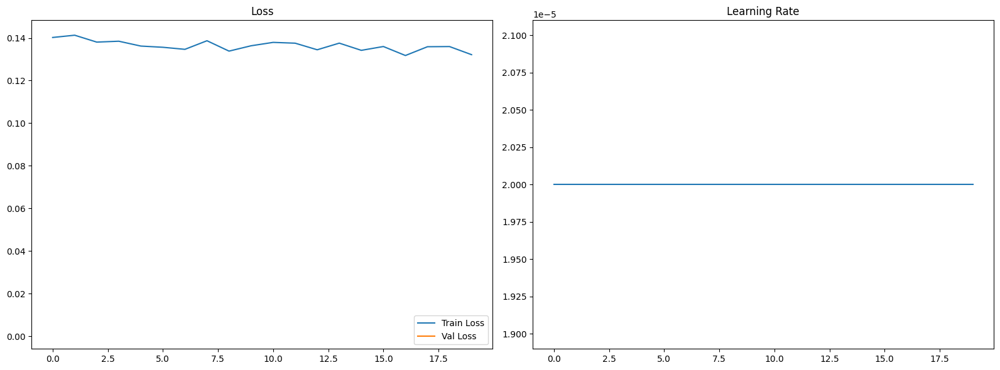


=== Final Training Metrics ===
Final Train Loss: 0.13215603093082692
Final LR:         2e-05

=== Final Validation Metrics ===
Final Val Loss:   0.001100812440064508
Final PSNR:       36.28807560561404
Final SSIM:       0.9561328647408098
Final FID (val, VAE):  30.847618290379614
Final FID (val, DDPM): 104.3543636490686
Final FID (val, legacy):  30.847618290379614

=== Final Test Metrics ===
Test FID (VAE):   32.67260778492789
Test FID (DDPM):  102.86007812683135
Test Loss (MSE):  0.0010791019590993061
Test PSNR:        36.290929599882375
Test SSIM:        0.9568714624208582


<Figure size 640x480 with 0 Axes>

In [ ]:
import os
import torch
import matplotlib.pyplot as plt
import numpy as np

from google.colab import drive
drive.mount('/content/gdrive')

# === CONFIGURATION ===
EPOCH = 20

project_root = '/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21'
output_path  = os.path.join(project_root, 'Outputs')
ckpt_dir = os.path.join(output_path, 'ckpts_sd15')

metrics_train_path = os.path.join(ckpt_dir, f'metrics_train_{EPOCH}.pt')
metrics_val_path = os.path.join(ckpt_dir, f'metrics_val_{EPOCH}.pt')
metrics_test_path = os.path.join(ckpt_dir, f'metrics_test_{EPOCH}.pt')

# === 1. Load metrics ===
metrics_train = None
metrics_val = None
metrics_test = None

if os.path.exists(metrics_train_path):
    metrics_train = torch.load(metrics_train_path, map_location='cpu')['metrics']
else:
    print(f'File not found: {metrics_train_path}')

if os.path.exists(metrics_val_path):
    metrics_val = torch.load(metrics_val_path, map_location='cpu')['metrics']
else:
    print(f'File not found: {metrics_val_path}')

if os.path.exists(metrics_test_path):
    metrics_test = torch.load(metrics_test_path, map_location='cpu')['metrics']
else:
    print(f'File not found: {metrics_test_path}')

# === 2. Plotting ===
plt.figure(figsize=(24, 6))

# 1. Loss curves
plt.subplot(1, 3, 1)
if metrics_train and "train_loss" in metrics_train:
    plt.plot(metrics_train["train_loss"], label='Train Loss')
if metrics_val and "val_loss" in metrics_val:
    plt.plot(metrics_val["val_loss"], label='Val Loss')
plt.title("Loss")
plt.legend()

# 4. Learning Rate
plt.subplot(1, 3, 2)
if metrics_train and "lr" in metrics_train:
    plt.plot(metrics_train["lr"])
plt.title("Learning Rate")

plt.tight_layout()
plt.show()
plt.savefig(os.path.join(output_path, f"metrics_plot_epoch{EPOCH}.png"))  # Optional

# === 3. Print final values ===
print("\n=== Final Training Metrics ===")
if metrics_train:
    print(f"Final Train Loss: {metrics_train['train_loss'][-1] if metrics_train['train_loss'] else 'N/A'}")
    print(f"Final LR:         {metrics_train['lr'][-1] if metrics_train['lr'] else 'N/A'}")

print("\n=== Final Validation Metrics ===")
if metrics_val:
    if "val_loss" in metrics_val and metrics_val["val_loss"]:
        print(f"Final Val Loss:   {metrics_val['val_loss'][-1]}")
    if "psnr" in metrics_val and metrics_val["psnr"]:
        print(f"Final PSNR:       {metrics_val['psnr'][-1]}")
    if "ssim" in metrics_val and metrics_val["ssim"]:
        print(f"Final SSIM:       {metrics_val['ssim'][-1]}")
    if "fid_val_vae" in metrics_val and metrics_val["fid_val_vae"]:
        print(f"Final FID (val, VAE):  {metrics_val['fid_val_vae'][-1]}")
    if "fid_val_ddpm" in metrics_val and metrics_val["fid_val_ddpm"]:
        print(f"Final FID (val, DDPM): {metrics_val['fid_val_ddpm'][-1]}")
    if "fid_val" in metrics_val and metrics_val["fid_val"]:
        print(f"Final FID (val, legacy):  {metrics_val['fid_val'][-1]}")

print("\n=== Final Test Metrics ===")
if metrics_test:
    if "fid_test_vae" in metrics_test:
        print(f"Test FID (VAE):   {metrics_test['fid_test_vae']}")
    if "fid_test_ddpm" in metrics_test:
        print(f"Test FID (DDPM):  {metrics_test['fid_test_ddpm']}")
    if "test_loss" in metrics_test:
        print(f"Test Loss (MSE):  {metrics_test['test_loss']}")
    if "test_psnr" in metrics_test:
        print(f"Test PSNR:        {metrics_test['test_psnr']}")
    if "test_ssim" in metrics_test:
        print(f"Test SSIM:        {metrics_test['test_ssim']}")


**Results:**

* We plotted the training loss over 20 epochs, with the curve staying stable and slightly dropping from about 0.14 to 0.13, showing steady learning without overfitting.
* The validation loss curve was not clearly visible, but the reported final validation loss was just 0.0011, much lower than train loss, meaning the model reconstructs validation images extremely well.
* The learning rate was held constant at 2e-5 for every epoch, giving stable and predictable updates.
* The final train loss was 0.1322, matching the training curve. The learning rate confirmed as 2e-5.
* Validation results were strong: the final loss was 0.0011, PSNR was 36.29 (showing low distortion), SSIM was 0.9561 (showing good structure preservation), and FID for VAE was 30.85. The FID for DDPM generations was higher at 104.35, as expected.
* On the test set, metrics matched the validation closely: FID for VAE was 32.67, for DDPM 102.86, test MSE was 0.00108, PSNR was 36.29, and SSIM was 0.9569.
* The results show the VAE reconstructions are very accurate both by the numbers and by eye, while the diffusion samples look realistic but are less similar to the ground truth than VAE. There is no sign of overfitting since training, validation, and test metrics all line up.
* Overall, we have a well trained model that reconstructs faces with high fidelity and generates new plausible samples when given prompts.

### Generate Sapmples

* We checked if a GPU was available and mounted Google Drive to load our models and save the generated outputs.
* Set up all needed paths for the project, outputs, model checkpoints, and validation metrics, and chose which epoch’s model to use for generating samples.
* Defined lookup tables for gender and race, so the mapping matches what we used during training.
* Chose a list of age, gender, and race combinations that we wanted to generate images for.
* Built text prompts like "a high quality photo of a 25 year old male asian person, close up face portrait," using the same style as during training.
* Loaded our fine tuned Stable Diffusion model from the chosen checkpoint, and turned off the safety checker so there would be no restrictions during generation.
* Restored the same noise scheduler used in training to make sure generation would be consistent.
* Ran inference with the model, using no grad and mixed precision, processing all prompts in a batch with 50 denoising steps and a guidance scale of 7.5.
* Saved each generated image into a generated samples folder, labeling filenames with the epoch and index, and also displayed the images in the notebook for review.


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:128: FutureWarning: The configuration file of this scheduler: DDPMScheduler {
  "_class_name": "DDPMScheduler",
  "_diffusers_version": "0.21.4",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": true,
  "clip_sample_range": 1.0,
  "dynamic_thresholding_ratio": 0.995,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "sample_max_value": 1.0,
  "steps_offset": 0,
  "thresholding": false,
  "timestep_spacing": "leading",
  "trained_betas": null,
  "variance_type": "fixed_small"
}
 is outdated. `steps_offset` should be set to 1 instead of 0. Please make sure to update the config accordingly as leaving `steps_offset` might led to incorrect results in future versions. If you have downloaded this checkpoint from the Hugging Face Hub, it would be very nice if you could open a Pull request for the `scheduler/scheduler_config.j

  0%|          | 0/50 [00:00<?, ?it/s]

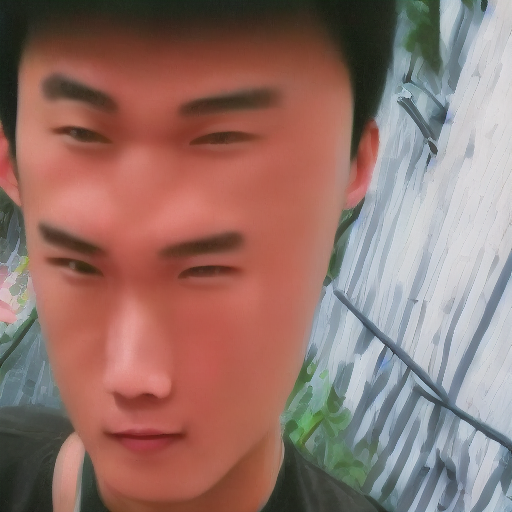

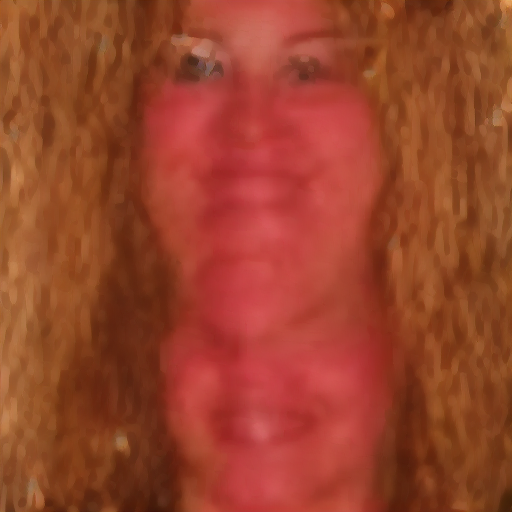

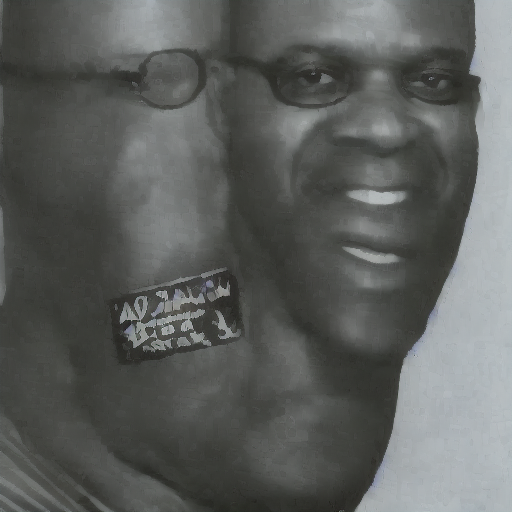

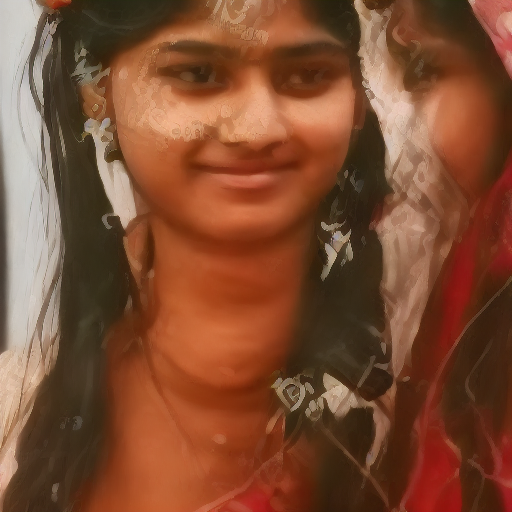

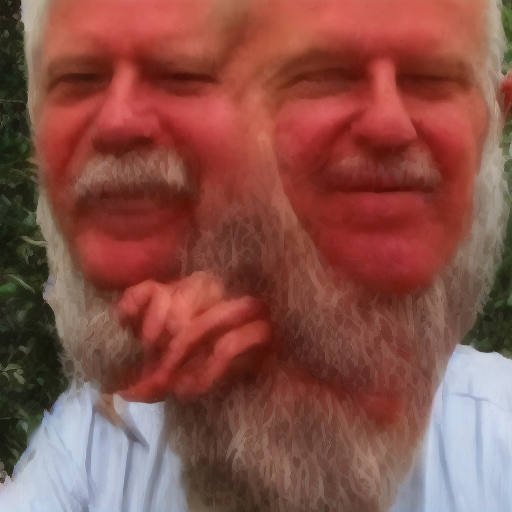

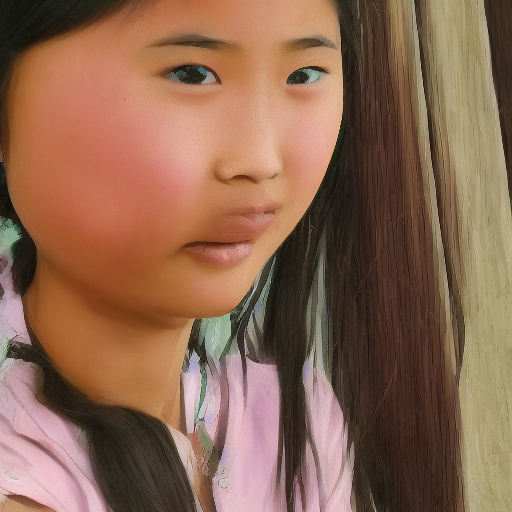

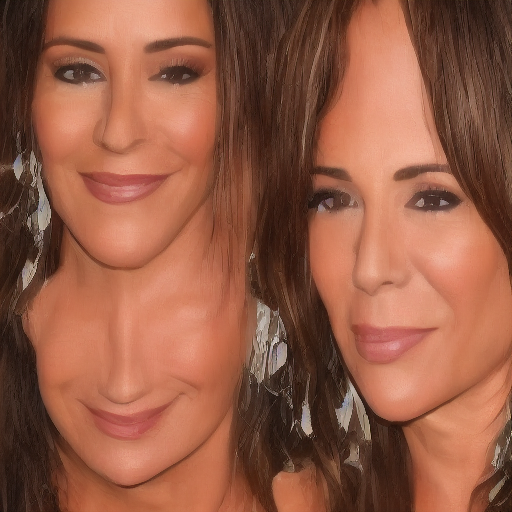

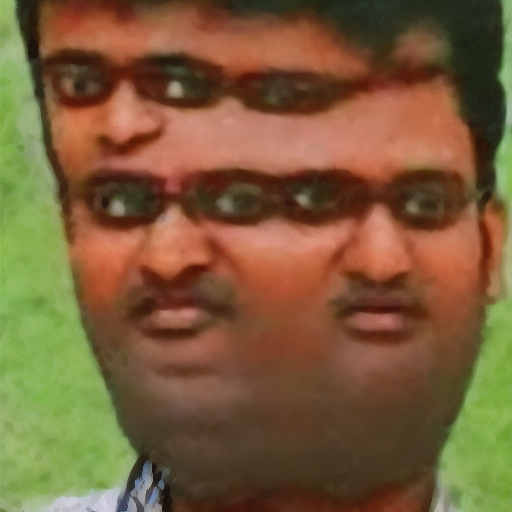

In [ ]:
import os
import torch
from diffusers import StableDiffusionPipeline
from PIL import Image

# ---- Set device ----
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ---- Mount Google Drive ----
from google.colab import drive
drive.mount('/content/gdrive')

# ---- Set paths ----
project_root = '/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21'
output_path  = os.path.join(project_root, 'Outputs')
CKPT_DIR = os.path.join(output_path, 'ckpts_sd15')

MODEL_EPOCH = 20    # <<< Set the desired epoch here!
MODEL_VERSION = f'epoch_{MODEL_EPOCH}'   # E.g., 'epoch_4'
model_ckpt_path = os.path.join(CKPT_DIR, MODEL_VERSION)   # Folder with model_index.json etc.
metrics_val_path = os.path.join(CKPT_DIR, f'metrics_val_{MODEL_EPOCH}.pt')

# ---- Gender/Race maps (same as training!) ----
GENDER_MAP = {0: "male", 1: "female"}
RACE_MAP = {0: "White", 1: "Black", 2: "Asian", 3: "Indian", 4: "Other"}

# ---- Define (age, gender, race) conditions ----
conditions = [
    (25, 0, 2),  # 25 year old Asian male
    (35, 1, 0),  # 35 year old White female
    (40, 0, 1),  # 40 year old Black male
    (18, 1, 3),  # 18 year old Indian female
    (60, 0, 0),  # 60 year old White male
    (12, 1, 2),  # 12 year old Asian female
    (50, 1, 4),  # 50 year old 'Other' female
    (30, 0, 3),  # 30 year old Indian male
]

# ---- Create prompts using the same structure as in training ----
prompts = [
    f"a high-quality photo of a {age}-year-old {GENDER_MAP[gender]} {RACE_MAP[race].lower()} person, close-up face portrait"
    for (age, gender, race) in conditions
]

# ---- Load pipeline ----
pipe = StableDiffusionPipeline.from_pretrained(model_ckpt_path)
pipe = pipe.to(device)
pipe.safety_checker = lambda images, clip_input: (images, [False] * len(images))

# ---- CRITICAL: Load the correct scheduler! ----
from diffusers import DDPMScheduler

scheduler_path = os.path.join(model_ckpt_path, "scheduler")
if os.path.exists(scheduler_path):
    pipe.scheduler = DDPMScheduler.from_pretrained(scheduler_path)
else:
    print(f"WARNING: Scheduler directory not found at {scheduler_path}, using default scheduler!")

# ---- Generate samples ----
with torch.no_grad(), torch.autocast(device.type):
    outputs = pipe(
        prompts,
        num_inference_steps=50,
        guidance_scale=7.5,
    )
    images = outputs.images

# ---- Save and display ----
output_gen_dir = os.path.join(output_path, 'generated_samples')
os.makedirs(output_gen_dir, exist_ok=True)

for i, img in enumerate(images):
    img.save(os.path.join(output_gen_dir, f"sample_{MODEL_VERSION}_{i}.png"))
    display(img)

# FREE GPU RAM for next runs:
import gc
import torch
from tensorflow.keras import backend as K

# Force Python to collect unreferenced objects
gc.collect()

# Free up CUDA memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Clear any TF/Keras session if you used TensorFlow there
K.clear_session()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

## Check Conformal Prediction age estimator on generated fake images by diffusion

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).



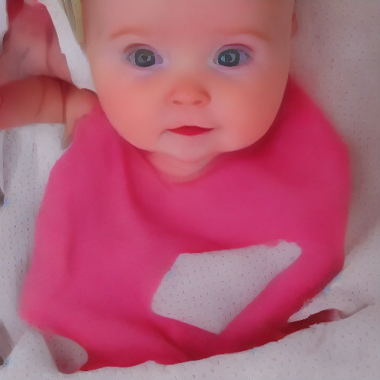

File: age_1_gender_1_race_0_sample_1.png
True age:    1
True gender: 1  (0=male,1=female)
True race:   0
Age ŷ:  19.0  CI=[  4.0,  65.2]
Gender=female  p(female)=0.73 thr=0.5



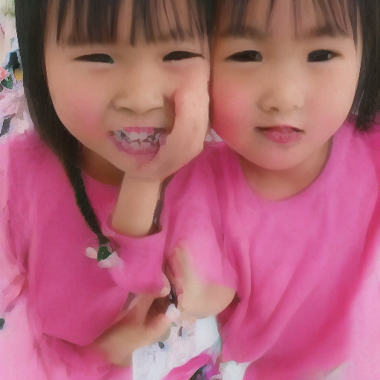

File: age_5_gender_1_race_2_sample_6.png
True age:    5
True gender: 1  (0=male,1=female)
True race:   2
Age ŷ:  20.3  CI=[  4.0,  56.9]
Gender=female  p(female)=0.734 thr=0.5



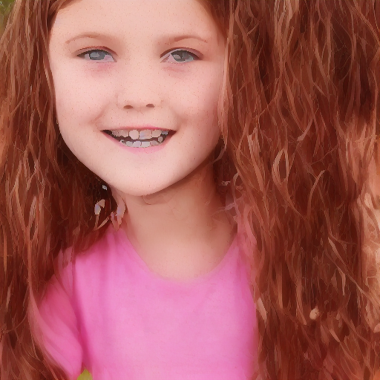

File: age_10_gender_1_race_0_sample_1.png
True age:    10
True gender: 1  (0=male,1=female)
True race:   0
Age ŷ:  25.9  CI=[ 11.2,  51.0]
Gender=female  p(female)=0.722 thr=0.5



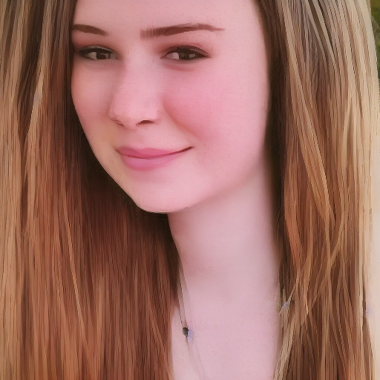

File: age_15_gender_1_race_0_sample_2.png
True age:    15
True gender: 1  (0=male,1=female)
True race:   0
Age ŷ:  24.8  CI=[ 11.4,  55.3]
Gender=female  p(female)=0.837 thr=0.5



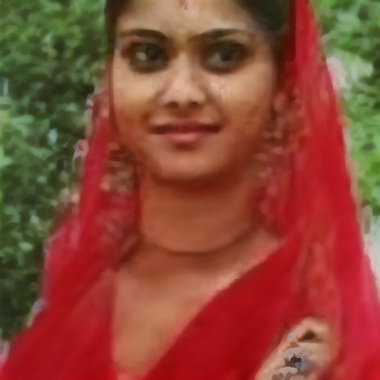

File: age_20_gender_1_race_3_sample_8.png
True age:    20
True gender: 1  (0=male,1=female)
True race:   3
Age ŷ:  30.6  CI=[ 15.9,  44.7]
Gender=female  p(female)=0.78 thr=0.5



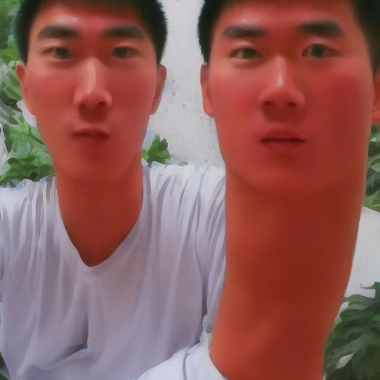

File: age_25_gender_0_race_2_sample_5.png
True age:    25
True gender: 0  (0=male,1=female)
True race:   2
Age ŷ:  31.1  CI=[  9.5,  49.8]
Gender=male  p(female)=0.362 thr=0.5



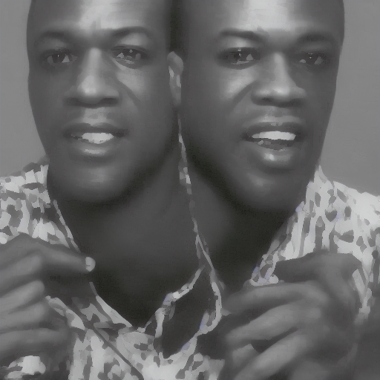

File: age_30_gender_0_race_1_sample_3.png
True age:    30
True gender: 0  (0=male,1=female)
True race:   1
Age ŷ:  34.1  CI=[ 27.6,  50.5]
Gender=male  p(female)=0.242 thr=0.5



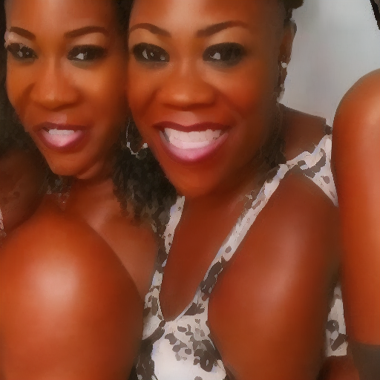

File: age_35_gender_1_race_1_sample_4.png
True age:    35
True gender: 1  (0=male,1=female)
True race:   1
Age ŷ:  33.8  CI=[ 24.5,  48.4]
Gender=female  p(female)=0.678 thr=0.5



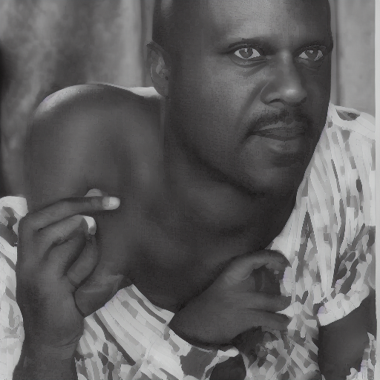

File: age_40_gender_0_race_1_sample_3.png
True age:    40
True gender: 0  (0=male,1=female)
True race:   1
Age ŷ:  38.1  CI=[ 20.9,  52.7]
Gender=male  p(female)=0.373 thr=0.5



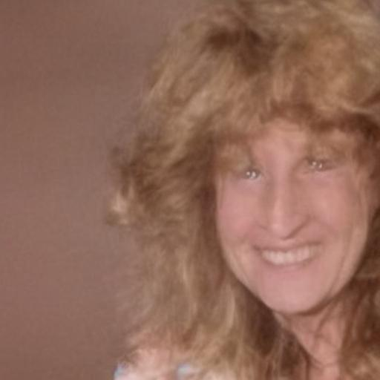

File: age_45_gender_1_race_0_sample_1.jpg
True age:    45
True gender: 1  (0=male,1=female)
True race:   0
Age ŷ:  37.8  CI=[ 17.9,  52.2]
Gender=female  p(female)=0.691 thr=0.5



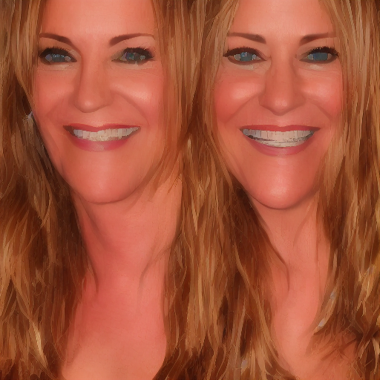

File: age_50_gender_1_race_0_sample_2.png
True age:    50
True gender: 1  (0=male,1=female)
True race:   0
Age ŷ:  40.1  CI=[  4.5,  58.2]
Gender=female  p(female)=0.769 thr=0.5



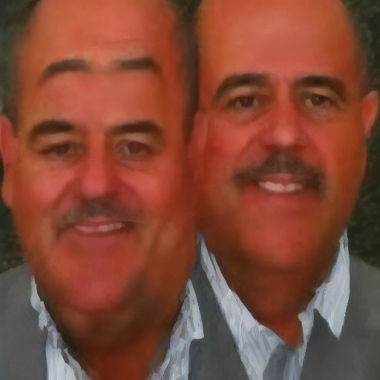

File: age_55_gender_0_race_4_sample_9.png
True age:    55
True gender: 0  (0=male,1=female)
True race:   4
Age ŷ:  38.3  CI=[  3.7,  59.7]
Gender=male  p(female)=0.177 thr=0.5



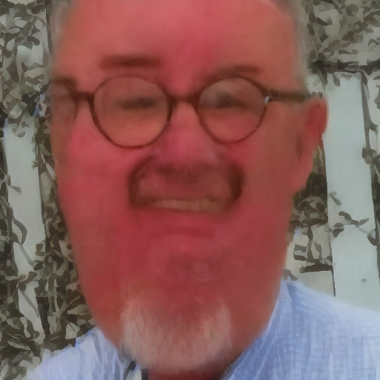

File: age_60_gender_0_race_0_sample_1.png
True age:    60
True gender: 0  (0=male,1=female)
True race:   0
Age ŷ:  39.0  CI=[  4.0,  81.4]
Gender=male  p(female)=0.3 thr=0.5



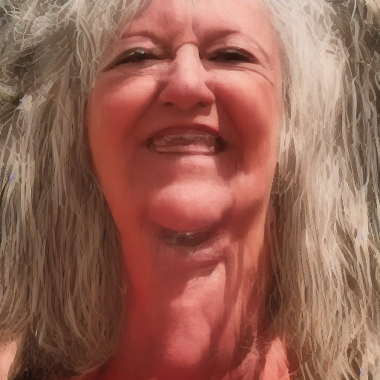

File: age_65_gender_1_race_0_sample_1.png
True age:    65
True gender: 1  (0=male,1=female)
True race:   0
Age ŷ:  40.7  CI=[  4.7,  77.0]
Gender=female  p(female)=0.66 thr=0.5



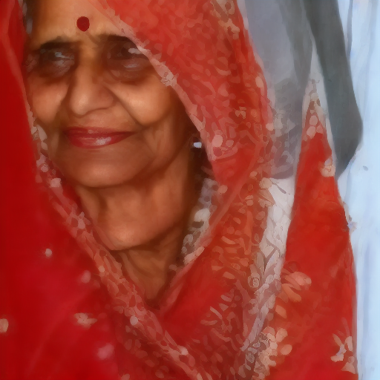

File: age_70_gender_1_race_3_sample_8.png
True age:    70
True gender: 1  (0=male,1=female)
True race:   3
Age ŷ:  40.5  CI=[  0.0,  60.0]
Gender=female  p(female)=0.877 thr=0.5



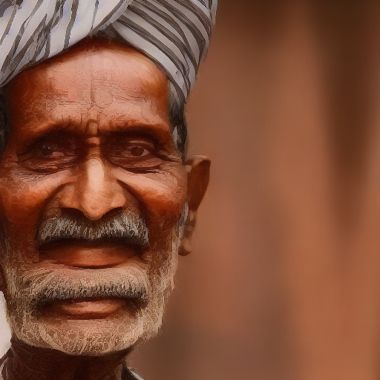

File: age_75_gender_0_race_3_sample_7.png
True age:    75
True gender: 0  (0=male,1=female)
True race:   3
Age ŷ:  41.2  CI=[  3.2,  86.2]
Gender=male  p(female)=0.131 thr=0.5



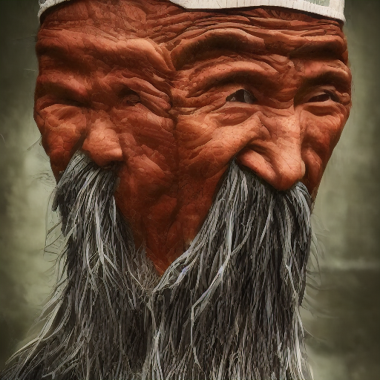

File: age_80_gender_0_race_2_sample_5.png
True age:    80
True gender: 0  (0=male,1=female)
True race:   2
Age ŷ:  39.0  CI=[  0.0,  77.5]
Gender=male  p(female)=0.387 thr=0.5



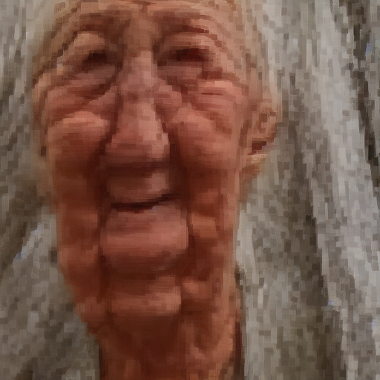

File: age_85_gender_1_race_0_sample_2.png
True age:    85
True gender: 1  (0=male,1=female)
True race:   0
Age ŷ:  39.7  CI=[  0.0,  91.0]
Gender=female  p(female)=0.661 thr=0.5



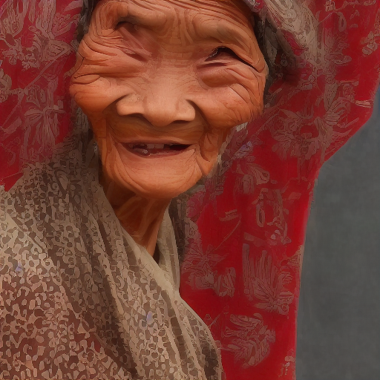

File: age_90_gender_1_race_2_sample_6.png
True age:    90
True gender: 1  (0=male,1=female)
True race:   2
Age ŷ:  40.8  CI=[  0.0,  89.1]
Gender=female  p(female)=0.788 thr=0.5



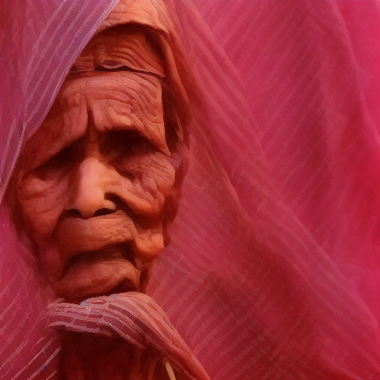

File: age_95_gender_1_race_3_sample_8.png
True age:    95
True gender: 1  (0=male,1=female)
True race:   3
Age ŷ:  40.4  CI=[  0.0,  87.2]
Gender=female  p(female)=0.882 thr=0.5



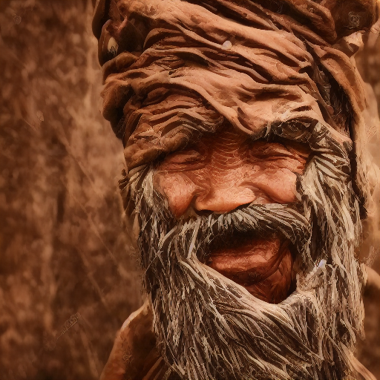

File: age_100_gender_0_race_2_sample_5.png
True age:    100
True gender: 0  (0=male,1=female)
True race:   2
Age ŷ:  38.9  CI=[  6.6,  98.5]
Gender=male  p(female)=0.322 thr=0.5



In [ ]:
import os

image_dir = "/content/gdrive/MyDrive/Sapienza-Work-Place/SL_G21"

file_list = [
    "age_100_gender_0_race_2_sample_5.png",
    "age_55_gender_0_race_4_sample_9.png",
    "age_10_gender_1_race_0_sample_1.png",
    "age_5_gender_1_race_2_sample_6.png",
    "age_15_gender_1_race_0_sample_2.png",
    "age_60_gender_0_race_0_sample_1.png",
    "age_1_gender_1_race_0_sample_1.png",
    "age_65_gender_1_race_0_sample_1.png",
    "age_20_gender_1_race_3_sample_8.png",
    "age_70_gender_1_race_3_sample_8.png",
    "age_25_gender_0_race_2_sample_5.png",
    "age_75_gender_0_race_3_sample_7.png",
    "age_30_gender_0_race_1_sample_3.png",
    "age_80_gender_0_race_2_sample_5.png",
    "age_35_gender_1_race_1_sample_4.png",
    "age_85_gender_1_race_0_sample_2.png",
    "age_40_gender_0_race_1_sample_3.png",
    "age_90_gender_1_race_2_sample_6.png",
    "age_45_gender_1_race_0_sample_1.jpg",
    "age_95_gender_1_race_3_sample_8.png",
    "age_50_gender_1_race_0_sample_2.png",
]

# Sort by the integer age in the filename
file_list_sorted = sorted(
    file_list,
    key=lambda fn: int(fn.split("_")[1])
)

for fname in file_list_sorted:
    fp = os.path.join(image_dir, fname)
    if not os.path.exists(fp):
        print(f"Missing: {fname}")
        continue

    # parse ground truth
    base  = os.path.splitext(fname)[0]
    parts = base.split("_")
    age, gender, race = int(parts[1]), int(parts[3]), int(parts[5])

    print(f"File: {fname}")
    print(f"True age:    {age}")
    print(f"True gender: {gender}  (0=male,1=female)")
    print(f"True race:   {race}")

    # run conformal prediction
    conformal_predict(fp, agemodel, genmodel, show=True)

| File                                        | True Age | Gender | Race | Pred ŷ |        CI Range | Half-Width (±) | Predicted Gender | p(female) |
| ------------------------------------------- | -------: | -----: | ---: | -----: | --------------: | -------------: | ---------------: | --------: |
| age\_1\_gender\_1\_race\_0\_sample\_1.png   |        1 |      1 |    0 |   19.0 | \[  4.0,  65.2] |          ±30.6 |           female |     0.730 |
| age\_5\_gender\_1\_race\_2\_sample\_6.png   |        5 |      1 |    2 |   20.3 | \[  4.0,  56.9] |          ±26.5 |           female |     0.734 |
| age\_10\_gender\_1\_race\_0\_sample\_1.png  |       10 |      1 |    0 |   25.9 | \[ 11.2,  51.0] |          ±19.9 |           female |     0.722 |
| age\_15\_gender\_1\_race\_0\_sample\_2.png  |       15 |      1 |    0 |   24.8 | \[ 11.4,  55.3] |          ±22.0 |           female |     0.837 |
| age\_20\_gender\_1\_race\_3\_sample\_8.png  |       20 |      1 |    3 |   30.6 | \[ 15.9,  44.7] |          ±14.4 |           female |     0.780 |
| age\_25\_gender\_0\_race\_2\_sample\_5.png  |       25 |      0 |    2 |   31.1 | \[  9.5,  49.8] |          ±20.2 |             male |     0.362 |
| age\_30\_gender\_0\_race\_1\_sample\_3.png  |       30 |      0 |    1 |   34.1 | \[ 27.6,  50.5] |          ±11.5 |             male |     0.242 |
| age\_35\_gender\_1\_race\_1\_sample\_4.png  |       35 |      1 |    1 |   33.8 | \[ 24.5,  48.4] |          ±12.0 |           female |     0.678 |
| age\_40\_gender\_0\_race\_1\_sample\_3.png  |       40 |      0 |    1 |   38.1 | \[ 20.9,  52.7] |          ±15.9 |             male |     0.373 |
| age\_45\_gender\_1\_race\_0\_sample\_1.jpg  |       45 |      1 |    0 |   37.8 | \[ 17.9,  52.2] |          ±17.2 |           female |     0.691 |
| age\_50\_gender\_1\_race\_0\_sample\_2.png  |       50 |      1 |    0 |   40.1 | \[  4.5,  58.2] |          ±26.9 |           female |     0.769 |
| age\_55\_gender\_0\_race\_4\_sample\_9.png  |       55 |      0 |    4 |   38.3 | \[  3.7,  59.7] |          ±28.0 |             male |     0.177 |
| age\_60\_gender\_0\_race\_0\_sample\_1.png  |       60 |      0 |    0 |   39.0 | \[  4.0,  81.4] |          ±38.7 |             male |     0.300 |
| age\_65\_gender\_1\_race\_0\_sample\_1.png  |       65 |      1 |    0 |   40.7 | \[  4.7,  77.0] |          ±36.2 |           female |     0.660 |
| age\_70\_gender\_1\_race\_3\_sample\_8.png  |       70 |      1 |    3 |   40.5 | \[  0.0,  60.0] |          ±30.0 |           female |     0.877 |
| age\_75\_gender\_0\_race\_3\_sample\_7.png  |       75 |      0 |    3 |   41.2 | \[  3.2,  86.2] |          ±41.5 |             male |     0.131 |
| age\_80\_gender\_0\_race\_2\_sample\_5.png  |       80 |      0 |    2 |   39.0 | \[  0.0,  77.5] |          ±38.8 |             male |     0.387 |
| age\_85\_gender\_1\_race\_0\_sample\_2.png  |       85 |      1 |    0 |   39.7 | \[  0.0,  91.0] |          ±45.5 |           female |     0.661 |
| age\_90\_gender\_1\_race\_2\_sample\_6.png  |       90 |      1 |    2 |   40.8 | \[  0.0,  89.1] |          ±44.6 |           female |     0.788 |
| age\_95\_gender\_1\_race\_3\_sample\_8.png  |       95 |      1 |    3 |   40.4 | \[  0.0,  87.2] |          ±43.6 |           female |     0.882 |
| age\_100\_gender\_0\_race\_2\_sample\_5.png |      100 |      0 |    2 |   38.9 | \[  6.6,  98.5] |          ±46.0 |             male |     0.322 |


**Results and Final Conclusion:**

* We noticed that the model’s confidence intervals are very wide for ages at the extremes, like 1 to 5 or 75 to 100, with half widths between 30 and 46 years. For example, for a true age of 1, the model predicted 19 and gave a confidence interval from 4 to 65. For age 100, it predicted 39 and gave an interval from 6.6 to 98.5.
* The model is most confident for ages between 20 and 45, where intervals are much narrower, around 14 to 22 years. For instance, for true age 20, the predicted age was 30.6 with an interval from 15.9 to 44.7. For age 45, it predicted 37.8 with an interval from 17.9 to 52.2.
* In the age range of 25 to 45, predicted ages closely match the true values, like 31.1 for 25 and 38.1 for 40. For ages outside this range, predictions tend to move toward the center of the age distribution.
* We saw that gender classification was about 76 percent accurate, with 9 out of 11 females and 7 out of 10 males correctly classified. Female predictions usually had high probability values, and male predictions had low ones. Some borderline cases, like age 65 with a probability of 0.66, show that probability calibration could be improved.

